# Intrusion detection on NSL-KDD

In [11]:
pip install pyspark

Note: you may need to restart the kernel to use updated packages.


## 2. Data loading

In [12]:
# Here are some imports that are used along this notebook
import os
import math
import itertools
import multiprocessing
import pandas
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from time import time
from collections import OrderedDict
%matplotlib inline
gt0 = time()

In [13]:
from pyspark import SparkConf, SparkContext
from pyspark.sql import SQLContext, Row

In [14]:
conf = SparkConf()\
    .setMaster(f"local[{multiprocessing.cpu_count()}]")\
    .setAppName("PySpark NSL-KDD")\
    .setAll([("spark.driver.memory", "8g"), ("spark.default.parallelism", f"{multiprocessing.cpu_count()}")])

# Creating local SparkContext with specified SparkConf and creating SQLContext based on it
sc = SparkContext.getOrCreate(conf=conf)
sqlContext = SQLContext(sc)

In [15]:
import pyspark
spark = pyspark.SQLContext.getOrCreate(sc)

In [16]:
from pyspark.sql.types import *
from pyspark.sql.functions import udf, split, col
import pyspark.sql.functions as sql

train20_nsl_kdd_dataset_path = "datasets/KDDTrain+_20Percent.txt"
train_nsl_kdd_dataset_path = "datasets/KDDTrain+.txt"
test_nsl_kdd_dataset_path = "datasets/KDDTest+.txt"

col_names = np.array(["duration","protocol_type","service","flag","src_bytes",
    "dst_bytes","land","wrong_fragment","urgent","hot","num_failed_logins",
    "logged_in","num_compromised","root_shell","su_attempted","num_root",
    "num_file_creations","num_shells","num_access_files","num_outbound_cmds",
    "is_host_login","is_guest_login","count","srv_count","serror_rate",
    "srv_serror_rate","rerror_rate","srv_rerror_rate","same_srv_rate",
    "diff_srv_rate","srv_diff_host_rate","dst_host_count","dst_host_srv_count",
    "dst_host_same_srv_rate","dst_host_diff_srv_rate","dst_host_same_src_port_rate",
    "dst_host_srv_diff_host_rate","dst_host_serror_rate","dst_host_srv_serror_rate",
    "dst_host_rerror_rate","dst_host_srv_rerror_rate","labels"])

nominal_inx = [1, 2, 3]
binary_inx = [6, 11, 13, 14, 20, 21]
numeric_inx = list(set(range(41)).difference(nominal_inx).difference(binary_inx))

nominal_cols = col_names[nominal_inx].tolist()
binary_cols = col_names[binary_inx].tolist()
numeric_cols = col_names[numeric_inx].tolist()

In [17]:
print(numeric_cols)

['duration', 'src_bytes', 'dst_bytes', 'wrong_fragment', 'urgent', 'hot', 'num_failed_logins', 'num_compromised', 'num_root', 'num_file_creations', 'num_shells', 'num_access_files', 'num_outbound_cmds', 'count', 'srv_count', 'serror_rate', 'srv_serror_rate', 'rerror_rate', 'srv_rerror_rate', 'same_srv_rate', 'diff_srv_rate', 'srv_diff_host_rate', 'dst_host_count', 'dst_host_srv_count', 'dst_host_same_srv_rate', 'dst_host_diff_srv_rate', 'dst_host_same_src_port_rate', 'dst_host_srv_diff_host_rate', 'dst_host_serror_rate', 'dst_host_srv_serror_rate', 'dst_host_rerror_rate', 'dst_host_srv_rerror_rate']


In [18]:
# Function to load dataset and divide it into 8 partitions
def load_dataset(path):
    dataset_rdd = sc.textFile(path, 8).map(lambda line: line.split(','))
    dataset_df = (dataset_rdd.toDF(col_names.tolist()).select(
                    col('duration').cast(DoubleType()),
                    col('protocol_type').cast(StringType()),
                    col('service').cast(StringType()),
                    col('flag').cast(StringType()),
                    col('src_bytes').cast(DoubleType()),
                    col('dst_bytes').cast(DoubleType()),
                    col('land').cast(DoubleType()),
                    col('wrong_fragment').cast(DoubleType()),
                    col('urgent').cast(DoubleType()),
                    col('hot').cast(DoubleType()),
                    col('num_failed_logins').cast(DoubleType()),
                    col('logged_in').cast(DoubleType()),
                    col('num_compromised').cast(DoubleType()),
                    col('root_shell').cast(DoubleType()),
                    col('su_attempted').cast(DoubleType()),
                    col('num_root').cast(DoubleType()),
                    col('num_file_creations').cast(DoubleType()),
                    col('num_shells').cast(DoubleType()),
                    col('num_access_files').cast(DoubleType()),
                    col('num_outbound_cmds').cast(DoubleType()),
                    col('is_host_login').cast(DoubleType()),
                    col('is_guest_login').cast(DoubleType()),
                    col('count').cast(DoubleType()),
                    col('srv_count').cast(DoubleType()),
                    col('serror_rate').cast(DoubleType()),
                    col('srv_serror_rate').cast(DoubleType()),
                    col('rerror_rate').cast(DoubleType()),
                    col('srv_rerror_rate').cast(DoubleType()),
                    col('same_srv_rate').cast(DoubleType()),
                    col('diff_srv_rate').cast(DoubleType()),
                    col('srv_diff_host_rate').cast(DoubleType()),
                    col('dst_host_count').cast(DoubleType()),
                    col('dst_host_srv_count').cast(DoubleType()),
                    col('dst_host_same_srv_rate').cast(DoubleType()),
                    col('dst_host_diff_srv_rate').cast(DoubleType()),
                    col('dst_host_same_src_port_rate').cast(DoubleType()),
                    col('dst_host_srv_diff_host_rate').cast(DoubleType()),
                    col('dst_host_serror_rate').cast(DoubleType()),
                    col('dst_host_srv_serror_rate').cast(DoubleType()),
                    col('dst_host_rerror_rate').cast(DoubleType()),
                    col('dst_host_srv_rerror_rate').cast(DoubleType()),
                    col('labels').cast(StringType())))

    return dataset_df

The first part of data preparation is deviding connections into normal and attack classes based on 'labels' column. Then attacks are splitted to four main categories: DoS, Probe, R2L and U2R. After this, all of those categories are indexed. Also, ID column is added to simplify work with clustered data.

In [19]:
from pyspark.ml import Pipeline, Transformer
from pyspark.ml.feature import StringIndexer
from pyspark import keyword_only
from pyspark.ml.param.shared import HasInputCol, HasOutputCol, Param

# Dictionary that contains mapping of various attacks to the four main categories
attack_dict = {
    'normal': 'normal',
    
    'back': 'DoS',
    'land': 'DoS',
    'neptune': 'DoS',
    'pod': 'DoS',
    'smurf': 'DoS',
    'teardrop': 'DoS',
    'mailbomb': 'DoS',
    'apache2': 'DoS',
    'processtable': 'DoS',
    'udpstorm': 'DoS',
    
    'ipsweep': 'Probe',
    'nmap': 'Probe',
    'portsweep': 'Probe',
    'satan': 'Probe',
    'mscan': 'Probe',
    'saint': 'Probe',

    'ftp_write': 'R2L',
    'guess_passwd': 'R2L',
    'imap': 'R2L',
    'multihop': 'R2L',
    'phf': 'R2L',
    'spy': 'R2L',
    'warezclient': 'R2L',
    'warezmaster': 'R2L',
    'sendmail': 'R2L',
    'named': 'R2L',
    'snmpgetattack': 'R2L',
    'snmpguess': 'R2L',
    'xlock': 'R2L',
    'xsnoop': 'R2L',
    'worm': 'R2L',
    
    'buffer_overflow': 'U2R',
    'loadmodule': 'U2R',
    'perl': 'U2R',
    'rootkit': 'U2R',
    'httptunnel': 'U2R',
    'ps': 'U2R',    
    'sqlattack': 'U2R',
    'xterm': 'U2R'
}

attack_mapping_udf = udf(lambda v: attack_dict[v])

class Labels2Converter(Transformer):

    @keyword_only
    def __init__(self):
        super(Labels2Converter, self).__init__()

    def _transform(self, dataset):
        return dataset.withColumn('labels2', sql.regexp_replace(col('labels'), '^(?!normal).*$', 'attack'))
     
class Labels5Converter(Transformer):
    
    @keyword_only
    def __init__(self):
        super(Labels5Converter, self).__init__()

    def _transform(self, dataset):
        return dataset.withColumn('labels5', attack_mapping_udf(col('labels')))
    
labels2_indexer = StringIndexer(inputCol="labels2", outputCol="labels2_index")
labels5_indexer = StringIndexer(inputCol="labels5", outputCol="labels5_index")

labels_mapping_pipeline = Pipeline(stages=[Labels2Converter(), Labels5Converter(), labels2_indexer, labels5_indexer])

labels2 = ['normal', 'attack']
labels5 = ['normal', 'DoS', 'Probe', 'R2L', 'U2R']
labels_col = 'labels2_index'

In [20]:
# Loading train data
t0 = time()
train_df = load_dataset(train_nsl_kdd_dataset_path)

# Fitting preparation pipeline
labels_mapping_model = labels_mapping_pipeline.fit(train_df)

# Transforming labels column and adding id column
train_df = labels_mapping_model.transform(train_df).withColumn('id', sql.monotonically_increasing_id())

train_df = train_df.cache()
print(train_df.count())
print(time() - t0)

23/05/12 21:43:33 INFO MemoryStore: Block broadcast_0 stored as values in memory (estimated size 358.3 KiB, free 4.1 GiB)
23/05/12 21:43:33 INFO MemoryStore: Block broadcast_0_piece0 stored as bytes in memory (estimated size 32.6 KiB, free 4.1 GiB)
23/05/12 21:43:33 INFO BlockManagerInfo: Added broadcast_0_piece0 in memory on 10.0.0.49:64347 (size: 32.6 KiB, free: 4.1 GiB)
23/05/12 21:43:33 INFO SparkContext: Created broadcast 0 from textFile at NativeMethodAccessorImpl.java:0
23/05/12 21:43:33 INFO FileInputFormat: Total input files to process : 1
23/05/12 21:43:33 INFO SparkContext: Starting job: runJob at PythonRDD.scala:179
23/05/12 21:43:33 INFO DAGScheduler: Got job 0 (runJob at PythonRDD.scala:179) with 1 output partitions
23/05/12 21:43:33 INFO DAGScheduler: Final stage: ResultStage 0 (runJob at PythonRDD.scala:179)
23/05/12 21:43:33 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:43:33 INFO DAGScheduler: Missing parents: List()
23/05/12 21:43:33 INFO DAGScheduler

125973
26.39453625679016


23/05/12 21:43:58 INFO CodeGenerator: Code generated in 37.364583 ms
23/05/12 21:43:58 INFO SparkContext: Starting job: count at NativeMethodAccessorImpl.java:0
23/05/12 21:43:58 INFO DAGScheduler: Got job 6 (count at NativeMethodAccessorImpl.java:0) with 1 output partitions
23/05/12 21:43:58 INFO DAGScheduler: Final stage: ResultStage 9 (count at NativeMethodAccessorImpl.java:0)
23/05/12 21:43:58 INFO DAGScheduler: Parents of final stage: List(ShuffleMapStage 8)
23/05/12 21:43:58 INFO DAGScheduler: Missing parents: List()
23/05/12 21:43:58 INFO DAGScheduler: Submitting ResultStage 9 (MapPartitionsRDD[35] at count at NativeMethodAccessorImpl.java:0), which has no missing parents
23/05/12 21:43:58 INFO MemoryStore: Block broadcast_7 stored as values in memory (estimated size 12.1 KiB, free 4.1 GiB)
23/05/12 21:43:58 INFO MemoryStore: Block broadcast_7_piece0 stored as bytes in memory (estimated size 5.8 KiB, free 4.1 GiB)
23/05/12 21:43:58 INFO BlockManagerInfo: Added broadcast_7_piece0

In [21]:
# Loading test data
t0 = time()
test_df = load_dataset(test_nsl_kdd_dataset_path)

# Transforming labels column and adding id column
test_df = labels_mapping_model.transform(test_df).withColumn('id', sql.monotonically_increasing_id())

test_df = test_df.cache()
print(f"Number of examples in test set: {test_df.count()}")
print(f"Time: {time() - t0:.2f}s")

23/05/12 21:43:58 INFO MemoryStore: Block broadcast_8 stored as values in memory (estimated size 358.3 KiB, free 4.1 GiB)
23/05/12 21:43:58 INFO MemoryStore: Block broadcast_8_piece0 stored as bytes in memory (estimated size 32.6 KiB, free 4.1 GiB)
23/05/12 21:43:58 INFO BlockManagerInfo: Added broadcast_8_piece0 in memory on 10.0.0.49:64347 (size: 32.6 KiB, free: 4.1 GiB)
23/05/12 21:43:58 INFO SparkContext: Created broadcast 8 from textFile at NativeMethodAccessorImpl.java:0
23/05/12 21:43:59 INFO FileInputFormat: Total input files to process : 1
23/05/12 21:43:59 INFO SparkContext: Starting job: runJob at PythonRDD.scala:179
23/05/12 21:43:59 INFO DAGScheduler: Got job 7 (runJob at PythonRDD.scala:179) with 1 output partitions
23/05/12 21:43:59 INFO DAGScheduler: Final stage: ResultStage 10 (runJob at PythonRDD.scala:179)
23/05/12 21:43:59 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:43:59 INFO DAGScheduler: Missing parents: List()
23/05/12 21:43:59 INFO DAGSchedule

Number of examples in test set: 22544
Time: 3.47s


23/05/12 21:44:02 INFO DAGScheduler: ShuffleMapStage 11 (count at NativeMethodAccessorImpl.java:0) finished in 1.776 s
23/05/12 21:44:02 INFO DAGScheduler: looking for newly runnable stages
23/05/12 21:44:02 INFO DAGScheduler: running: Set()
23/05/12 21:44:02 INFO DAGScheduler: waiting: Set()
23/05/12 21:44:02 INFO DAGScheduler: failed: Set()
23/05/12 21:44:02 INFO SparkContext: Starting job: count at NativeMethodAccessorImpl.java:0
23/05/12 21:44:02 INFO DAGScheduler: Got job 9 (count at NativeMethodAccessorImpl.java:0) with 1 output partitions
23/05/12 21:44:02 INFO DAGScheduler: Final stage: ResultStage 13 (count at NativeMethodAccessorImpl.java:0)
23/05/12 21:44:02 INFO DAGScheduler: Parents of final stage: List(ShuffleMapStage 12)
23/05/12 21:44:02 INFO DAGScheduler: Missing parents: List()
23/05/12 21:44:02 INFO DAGScheduler: Submitting ResultStage 13 (MapPartitionsRDD[56] at count at NativeMethodAccessorImpl.java:0), which has no missing parents
23/05/12 21:44:02 INFO MemoryStor

## 2. Exploratory Data Analysis

23/05/12 21:44:02 INFO CodeGenerator: Code generated in 136.890583 ms
23/05/12 21:44:02 INFO DAGScheduler: Registering RDD 61 (collect at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/4262531785.py:2) as input to shuffle 4
23/05/12 21:44:02 INFO DAGScheduler: Got map stage job 10 (collect at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/4262531785.py:2) with 8 output partitions
23/05/12 21:44:02 INFO DAGScheduler: Final stage: ShuffleMapStage 14 (collect at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/4262531785.py:2)
23/05/12 21:44:02 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:44:02 INFO DAGScheduler: Missing parents: List()
23/05/12 21:44:02 INFO DAGScheduler: Submitting ShuffleMapStage 14 (MapPartitionsRDD[61] at collect at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/4262531785.py:2), which has no missing parents
23/05/12 21:44:02 INFO MemoryStore: Block broadcast_12 stored as values in

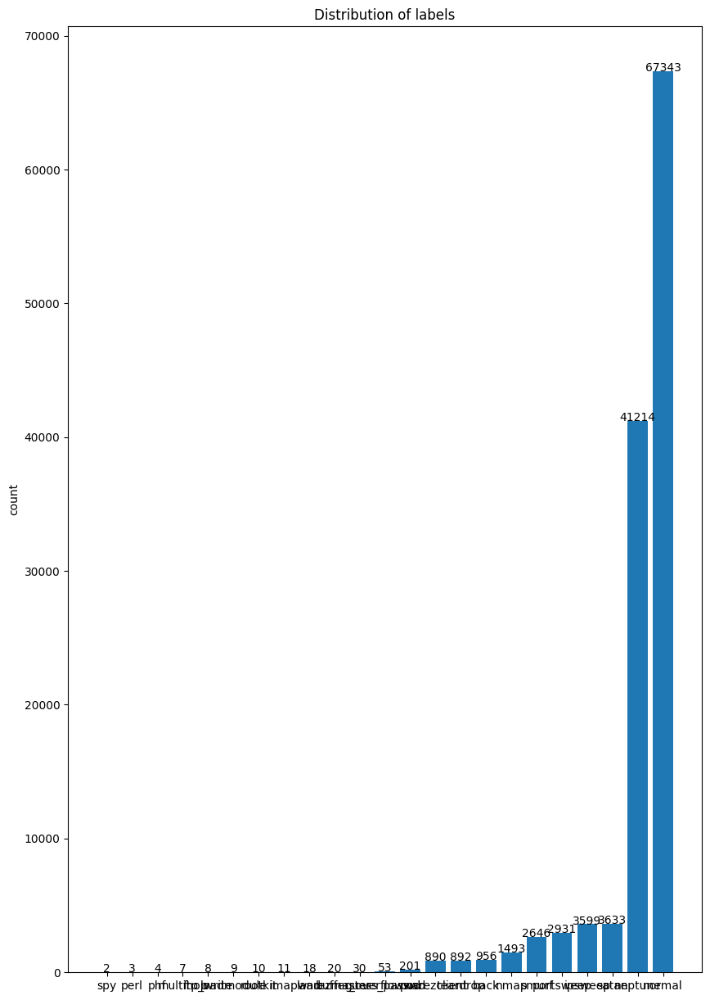

In [22]:
plt.figure(figsize=(10,15))
class_distribution=train_df.groupby('labels').count().sort(sql.desc('count')).collect()
labels_count_df = spark.createDataFrame(class_distribution).toPandas()
labels_count_pd = labels_count_df.sort_values(by='count')
plt.bar(labels_count_pd['labels'], labels_count_pd['count'])

for i, v in enumerate(labels_count_pd['count']):
    plt.text(i, v + 0.1, str(round(v, 2)), ha='center')

# Add axis labels and a title
plt.ylabel('count')
plt.title('Distribution of labels')

# Display the plot
plt.show()

In [23]:
(train_df.groupby('labels2').count().show())

23/05/12 21:44:05 INFO DAGScheduler: Registering RDD 82 (showString at NativeMethodAccessorImpl.java:0) as input to shuffle 6
23/05/12 21:44:05 INFO DAGScheduler: Got map stage job 15 (showString at NativeMethodAccessorImpl.java:0) with 8 output partitions
23/05/12 21:44:05 INFO DAGScheduler: Final stage: ShuffleMapStage 23 (showString at NativeMethodAccessorImpl.java:0)
23/05/12 21:44:05 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:44:05 INFO DAGScheduler: Missing parents: List()
23/05/12 21:44:05 INFO DAGScheduler: Submitting ShuffleMapStage 23 (MapPartitionsRDD[82] at showString at NativeMethodAccessorImpl.java:0), which has no missing parents
23/05/12 21:44:05 INFO MemoryStore: Block broadcast_17 stored as values in memory (estimated size 122.5 KiB, free 4.0 GiB)
23/05/12 21:44:05 INFO MemoryStore: Block broadcast_17_piece0 stored as bytes in memory (estimated size 41.6 KiB, free 4.0 GiB)
23/05/12 21:44:05 INFO BlockManagerInfo: Added broadcast_17_piece0 in memory 

+-------+-----+
|labels2|count|
+-------+-----+
| normal|67343|
| attack|58630|
+-------+-----+



23/05/12 21:44:06 INFO DAGScheduler: Registering RDD 90 (toPandas at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/2015103403.py:1) as input to shuffle 7
23/05/12 21:44:06 INFO DAGScheduler: Got map stage job 17 (toPandas at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/2015103403.py:1) with 8 output partitions
23/05/12 21:44:06 INFO DAGScheduler: Final stage: ShuffleMapStage 26 (toPandas at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/2015103403.py:1)
23/05/12 21:44:06 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:44:06 INFO DAGScheduler: Missing parents: List()
23/05/12 21:44:06 INFO DAGScheduler: Submitting ShuffleMapStage 26 (MapPartitionsRDD[90] at toPandas at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/2015103403.py:1), which has no missing parents
23/05/12 21:44:06 INFO MemoryStore: Block broadcast_19 stored as values in memory (estimated size 122.5 KiB, free 4.0 GiB)
23/05/12 21:44:06

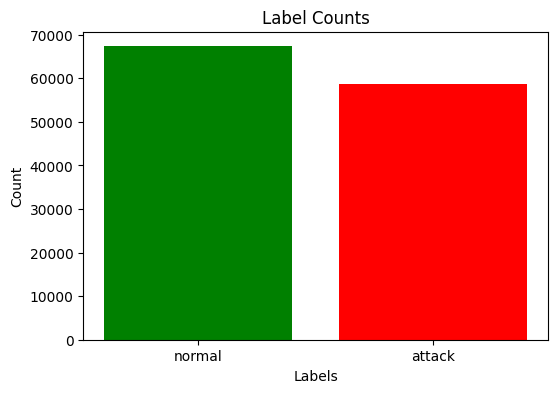

In [24]:
label_counts = train_df.groupby('labels2').count().toPandas()

# Set the figure size
plt.figure(figsize=(6,4))

# Define the colors for the bars
colors = ['red' if label != 'normal' else 'green' for label in label_counts['labels2']]

# Create the bar plot with the defined colors
plt.bar(label_counts['labels2'], label_counts['count'], color=colors)

plt.xlabel('Labels')
plt.ylabel('Count')
plt.title('Label Counts')

# Show the plot
plt.show()


In [25]:
# Labels columns

(train_df.groupby('labels5').count().sort(sql.desc('count')).show())

23/05/12 21:44:06 INFO DAGScheduler: Registering RDD 98 (showString at NativeMethodAccessorImpl.java:0) as input to shuffle 8
23/05/12 21:44:06 INFO DAGScheduler: Got map stage job 19 (showString at NativeMethodAccessorImpl.java:0) with 8 output partitions
23/05/12 21:44:06 INFO DAGScheduler: Final stage: ShuffleMapStage 29 (showString at NativeMethodAccessorImpl.java:0)
23/05/12 21:44:06 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:44:06 INFO DAGScheduler: Missing parents: List()
23/05/12 21:44:06 INFO DAGScheduler: Submitting ShuffleMapStage 29 (MapPartitionsRDD[98] at showString at NativeMethodAccessorImpl.java:0), which has no missing parents
23/05/12 21:44:06 INFO MemoryStore: Block broadcast_21 stored as values in memory (estimated size 122.5 KiB, free 4.0 GiB)
23/05/12 21:44:06 INFO MemoryStore: Block broadcast_21_piece0 stored as bytes in memory (estimated size 41.6 KiB, free 4.0 GiB)
23/05/12 21:44:06 INFO BlockManagerInfo: Added broadcast_21_piece0 in memory 

+-------+-----+
|labels5|count|
+-------+-----+
| normal|67343|
|    DoS|45927|
|  Probe|11656|
|    R2L|  995|
|    U2R|   52|
+-------+-----+



23/05/12 21:44:07 INFO Executor: Finished task 5.0 in stage 29.0 (TID 80). 3369 bytes result sent to driver
23/05/12 21:44:07 INFO Executor: Finished task 1.0 in stage 29.0 (TID 76). 3369 bytes result sent to driver
23/05/12 21:44:07 INFO Executor: Finished task 0.0 in stage 29.0 (TID 75). 3369 bytes result sent to driver
23/05/12 21:44:07 INFO Executor: Finished task 2.0 in stage 29.0 (TID 77). 3326 bytes result sent to driver
23/05/12 21:44:07 INFO Executor: Finished task 3.0 in stage 29.0 (TID 78). 3369 bytes result sent to driver
23/05/12 21:44:07 INFO Executor: Finished task 4.0 in stage 29.0 (TID 79). 3326 bytes result sent to driver
23/05/12 21:44:07 INFO Executor: Finished task 7.0 in stage 29.0 (TID 82). 3326 bytes result sent to driver
23/05/12 21:44:07 INFO TaskSetManager: Finished task 0.0 in stage 29.0 (TID 75) in 227 ms on 10.0.0.49 (executor driver) (1/8)
23/05/12 21:44:07 INFO TaskSetManager: Finished task 3.0 in stage 29.0 (TID 78) in 226 ms on 10.0.0.49 (executor driv

Here are some descriptive statistics of available features.

23/05/12 21:44:07 INFO DAGScheduler: Registering RDD 107 (collect at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/2989316185.py:5) as input to shuffle 9
23/05/12 21:44:07 INFO DAGScheduler: Got map stage job 21 (collect at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/2989316185.py:5) with 8 output partitions
23/05/12 21:44:07 INFO DAGScheduler: Final stage: ShuffleMapStage 32 (collect at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/2989316185.py:5)
23/05/12 21:44:07 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:44:07 INFO DAGScheduler: Missing parents: List()
23/05/12 21:44:07 INFO DAGScheduler: Submitting ShuffleMapStage 32 (MapPartitionsRDD[107] at collect at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/2989316185.py:5), which has no missing parents
23/05/12 21:44:07 INFO MemoryStore: Block broadcast_23 stored as values in memory (estimated size 122.5 KiB, free 4.0 GiB)
23/05/12 21:44:07 I

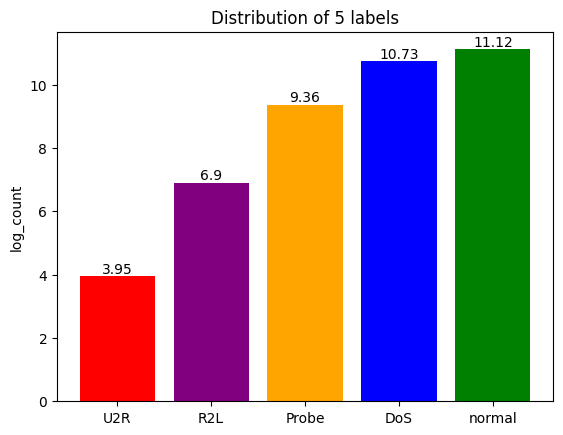

In [26]:
# Labels columns
from pyspark.sql.functions import log

# Create a dataframe of label counts
labels_count = train_df.groupby('labels5').count().sort(sql.desc('count')).collect()
labels_count_df = spark.createDataFrame(labels_count)

# Define the colors for the bars
colors = ['red', 'purple', 'orange','blue', 'green']

# Compute the logarithm of the count column
labels_count_df = labels_count_df.withColumn('log_count', log('count'))

# Convert the PySpark DataFrame to a pandas DataFrame for plotting
labels_count_pd = labels_count_df.toPandas()

# Sort the pandas DataFrame by the logarithm of the count
labels_count_pd = labels_count_pd.sort_values(by='log_count')

# Create a bar graph with the defined colors
plt.bar(labels_count_pd['labels5'], labels_count_pd['log_count'], color=colors)

for i, v in enumerate(labels_count_pd['log_count']):
    plt.text(i, v + 0.1, str(round(v, 2)), ha='center')

# Add axis labels and a title
plt.ylabel('log_count')
plt.title('Distribution of 5 labels')

# Display the plot
plt.show()


In [27]:
(test_df.groupby('labels2').count().show())

23/05/12 21:44:08 INFO DAGScheduler: Registering RDD 128 (showString at NativeMethodAccessorImpl.java:0) as input to shuffle 11
23/05/12 21:44:08 INFO DAGScheduler: Got map stage job 26 (showString at NativeMethodAccessorImpl.java:0) with 8 output partitions
23/05/12 21:44:08 INFO DAGScheduler: Final stage: ShuffleMapStage 41 (showString at NativeMethodAccessorImpl.java:0)
23/05/12 21:44:08 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:44:08 INFO DAGScheduler: Missing parents: List()
23/05/12 21:44:08 INFO DAGScheduler: Submitting ShuffleMapStage 41 (MapPartitionsRDD[128] at showString at NativeMethodAccessorImpl.java:0), which has no missing parents
23/05/12 21:44:08 INFO MemoryStore: Block broadcast_28 stored as values in memory (estimated size 122.5 KiB, free 4.0 GiB)
23/05/12 21:44:08 INFO MemoryStore: Block broadcast_28_piece0 stored as bytes in memory (estimated size 41.6 KiB, free 4.0 GiB)
23/05/12 21:44:08 INFO BlockManagerInfo: Added broadcast_28_piece0 in memo

+-------+-----+
|labels2|count|
+-------+-----+
| normal| 9711|
| attack|12833|
+-------+-----+



23/05/12 21:44:08 INFO TaskSetManager: Starting task 0.0 in stage 43.0 (TID 111) (10.0.0.49, executor driver, partition 0, NODE_LOCAL, 7363 bytes) 
23/05/12 21:44:08 INFO Executor: Running task 0.0 in stage 43.0 (TID 111)
23/05/12 21:44:08 INFO ShuffleBlockFetcherIterator: Getting 8 (1216.0 B) non-empty blocks including 8 (1216.0 B) local and 0 (0.0 B) host-local and 0 (0.0 B) push-merged-local and 0 (0.0 B) remote blocks
23/05/12 21:44:08 INFO ShuffleBlockFetcherIterator: Started 0 remote fetches in 2 ms
23/05/12 21:44:08 INFO Executor: Finished task 0.0 in stage 43.0 (TID 111). 5770 bytes result sent to driver
23/05/12 21:44:08 INFO TaskSetManager: Finished task 0.0 in stage 43.0 (TID 111) in 40 ms on 10.0.0.49 (executor driver) (1/1)
23/05/12 21:44:08 INFO TaskSchedulerImpl: Removed TaskSet 43.0, whose tasks have all completed, from pool 
23/05/12 21:44:08 INFO DAGScheduler: ResultStage 43 (showString at NativeMethodAccessorImpl.java:0) finished in 0.054 s
23/05/12 21:44:08 INFO DAG

23/05/12 21:44:08 INFO DAGScheduler: Registering RDD 136 (toPandas at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/4035686177.py:1) as input to shuffle 12
23/05/12 21:44:08 INFO DAGScheduler: Got map stage job 28 (toPandas at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/4035686177.py:1) with 8 output partitions
23/05/12 21:44:08 INFO DAGScheduler: Final stage: ShuffleMapStage 44 (toPandas at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/4035686177.py:1)
23/05/12 21:44:08 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:44:08 INFO DAGScheduler: Missing parents: List()
23/05/12 21:44:08 INFO DAGScheduler: Submitting ShuffleMapStage 44 (MapPartitionsRDD[136] at toPandas at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/4035686177.py:1), which has no missing parents
23/05/12 21:44:08 INFO MemoryStore: Block broadcast_30 stored as values in memory (estimated size 122.5 KiB, free 4.0 GiB)
23/05/12 21:44

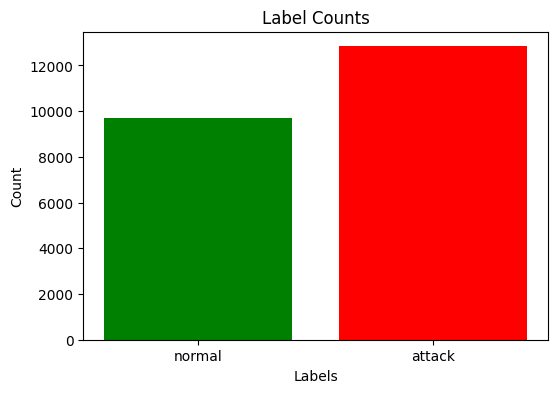

In [28]:
label_counts = test_df.groupby('labels2').count().toPandas()

# Set the figure size
plt.figure(figsize=(6,4))

# Define the colors for the bars
colors = ['red' if label != 'normal' else 'green' for label in label_counts['labels2']]

# Create the bar plot with the defined colors
plt.bar(label_counts['labels2'], label_counts['count'], color=colors)

plt.xlabel('Labels')
plt.ylabel('Count')
plt.title('Label Counts')

# Show the plot
plt.show()


In [29]:

(test_df.groupby('labels5').count().sort(sql.desc('count')).show())

23/05/12 21:44:09 INFO DAGScheduler: Registering RDD 144 (showString at NativeMethodAccessorImpl.java:0) as input to shuffle 13
23/05/12 21:44:09 INFO DAGScheduler: Got map stage job 30 (showString at NativeMethodAccessorImpl.java:0) with 8 output partitions
23/05/12 21:44:09 INFO DAGScheduler: Final stage: ShuffleMapStage 47 (showString at NativeMethodAccessorImpl.java:0)
23/05/12 21:44:09 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:44:09 INFO DAGScheduler: Missing parents: List()
23/05/12 21:44:09 INFO DAGScheduler: Submitting ShuffleMapStage 47 (MapPartitionsRDD[144] at showString at NativeMethodAccessorImpl.java:0), which has no missing parents
23/05/12 21:44:09 INFO MemoryStore: Block broadcast_32 stored as values in memory (estimated size 122.5 KiB, free 4.0 GiB)
23/05/12 21:44:09 INFO MemoryStore: Block broadcast_32_piece0 stored as bytes in memory (estimated size 41.6 KiB, free 4.0 GiB)
23/05/12 21:44:09 INFO BlockManagerInfo: Added broadcast_32_piece0 in memo

+-------+-----+
|labels5|count|
+-------+-----+
| normal| 9711|
|    DoS| 7458|
|    R2L| 2754|
|  Probe| 2421|
|    U2R|  200|
+-------+-----+



23/05/12 21:44:09 INFO Executor: Finished task 0.0 in stage 47.0 (TID 121). 3326 bytes result sent to driver
23/05/12 21:44:09 INFO Executor: Finished task 7.0 in stage 47.0 (TID 128). 3369 bytes result sent to driver
23/05/12 21:44:09 INFO Executor: Finished task 2.0 in stage 47.0 (TID 123). 3369 bytes result sent to driver
23/05/12 21:44:09 INFO Executor: Finished task 1.0 in stage 47.0 (TID 122). 3326 bytes result sent to driver
23/05/12 21:44:09 INFO Executor: Finished task 4.0 in stage 47.0 (TID 125). 3326 bytes result sent to driver
23/05/12 21:44:09 INFO Executor: Finished task 6.0 in stage 47.0 (TID 127). 3369 bytes result sent to driver
23/05/12 21:44:09 INFO Executor: Finished task 3.0 in stage 47.0 (TID 124). 3326 bytes result sent to driver
23/05/12 21:44:09 INFO TaskSetManager: Finished task 7.0 in stage 47.0 (TID 128) in 229 ms on 10.0.0.49 (executor driver) (1/8)
23/05/12 21:44:09 INFO TaskSetManager: Finished task 2.0 in stage 47.0 (TID 123) in 230 ms on 10.0.0.49 (exec

23/05/12 21:44:09 INFO DAGScheduler: Registering RDD 153 (collect at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/462580995.py:5) as input to shuffle 14
23/05/12 21:44:09 INFO DAGScheduler: Got map stage job 32 (collect at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/462580995.py:5) with 8 output partitions
23/05/12 21:44:09 INFO DAGScheduler: Final stage: ShuffleMapStage 50 (collect at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/462580995.py:5)
23/05/12 21:44:09 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:44:09 INFO DAGScheduler: Missing parents: List()
23/05/12 21:44:09 INFO DAGScheduler: Submitting ShuffleMapStage 50 (MapPartitionsRDD[153] at collect at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/462580995.py:5), which has no missing parents
23/05/12 21:44:09 INFO MemoryStore: Block broadcast_34 stored as values in memory (estimated size 122.5 KiB, free 4.0 GiB)
23/05/12 21:44:09 INFO

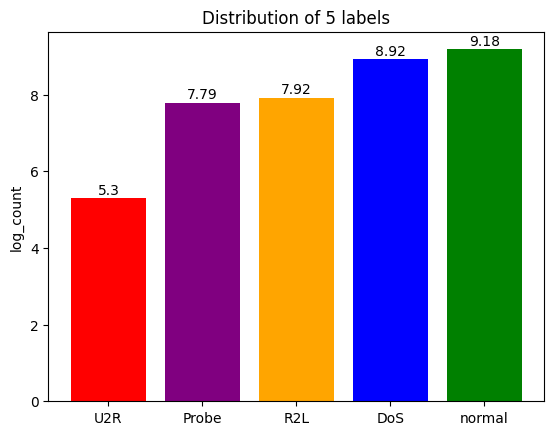

In [30]:
# Labels columns
from pyspark.sql.functions import log

# Create a dataframe of label counts
labels_count = test_df.groupby('labels5').count().sort(sql.desc('count')).collect()
labels_count_df = spark.createDataFrame(labels_count)

# Define the colors for the bars
colors = ['red', 'purple', 'orange','blue', 'green']

# Compute the logarithm of the count column
labels_count_df = labels_count_df.withColumn('log_count', log('count'))

# Convert the PySpark DataFrame to a pandas DataFrame for plotting
labels_count_pd = labels_count_df.toPandas()

# Sort the pandas DataFrame by the logarithm of the count
labels_count_pd = labels_count_pd.sort_values(by='log_count')

# Create a bar graph with the defined colors
plt.bar(labels_count_pd['labels5'], labels_count_pd['log_count'], color=colors)

for i, v in enumerate(labels_count_pd['log_count']):
    plt.text(i, v + 0.1, str(round(v, 2)), ha='center')

# Add axis labels and a title
plt.ylabel('log_count')
plt.title('Distribution of 5 labels')

# Display the plot
plt.show()


In [31]:
# 'protocol_type' nominal column
(train_df.crosstab(nominal_cols[0], 'labels2').sort(sql.asc(nominal_cols[0] + '_labels2')).show())

23/05/12 21:44:11 INFO CodeGenerator: Code generated in 79.395708 ms
23/05/12 21:44:11 INFO DAGScheduler: Registering RDD 175 (crosstab at NativeMethodAccessorImpl.java:0) as input to shuffle 16
23/05/12 21:44:11 INFO DAGScheduler: Got map stage job 37 (crosstab at NativeMethodAccessorImpl.java:0) with 8 output partitions
23/05/12 21:44:11 INFO DAGScheduler: Final stage: ShuffleMapStage 59 (crosstab at NativeMethodAccessorImpl.java:0)
23/05/12 21:44:11 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:44:11 INFO DAGScheduler: Missing parents: List()
23/05/12 21:44:11 INFO DAGScheduler: Submitting ShuffleMapStage 59 (MapPartitionsRDD[175] at crosstab at NativeMethodAccessorImpl.java:0), which has no missing parents
23/05/12 21:44:11 INFO MemoryStore: Block broadcast_39 stored as values in memory (estimated size 118.2 KiB, free 4.0 GiB)
23/05/12 21:44:11 INFO MemoryStore: Block broadcast_39_piece0 stored as bytes in memory (estimated size 39.9 KiB, free 4.0 GiB)
23/05/12 21:4

+---------------------+------+------+
|protocol_type_labels2|attack|normal|
+---------------------+------+------+
|                 icmp|  6982|  1309|
|                  tcp| 49089| 53600|
|                  udp|  2559| 12434|
+---------------------+------+------+



23/05/12 21:44:15 INFO CodeGenerator: Code generated in 14.474584 ms


In [32]:
import pyspark

23/05/12 21:44:15 INFO HashAggregateExec: spark.sql.codegen.aggregate.map.twolevel.enabled is set to true, but current version of codegened fast hashmap does not support this aggregate.
23/05/12 21:44:15 INFO CodeGenerator: Code generated in 33.918625 ms
23/05/12 21:44:15 INFO DAGScheduler: Registering RDD 204 (pivot at NativeMethodAccessorImpl.java:0) as input to shuffle 20
23/05/12 21:44:15 INFO DAGScheduler: Got map stage job 44 (pivot at NativeMethodAccessorImpl.java:0) with 8 output partitions
23/05/12 21:44:15 INFO DAGScheduler: Final stage: ShuffleMapStage 73 (pivot at NativeMethodAccessorImpl.java:0)
23/05/12 21:44:15 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:44:15 INFO DAGScheduler: Missing parents: List()
23/05/12 21:44:15 INFO DAGScheduler: Submitting ShuffleMapStage 73 (MapPartitionsRDD[204] at pivot at NativeMethodAccessorImpl.java:0), which has no missing parents
23/05/12 21:44:15 INFO MemoryStore: Block broadcast_46 stored as values in memory (estimat

<Figure size 1000x500 with 0 Axes>

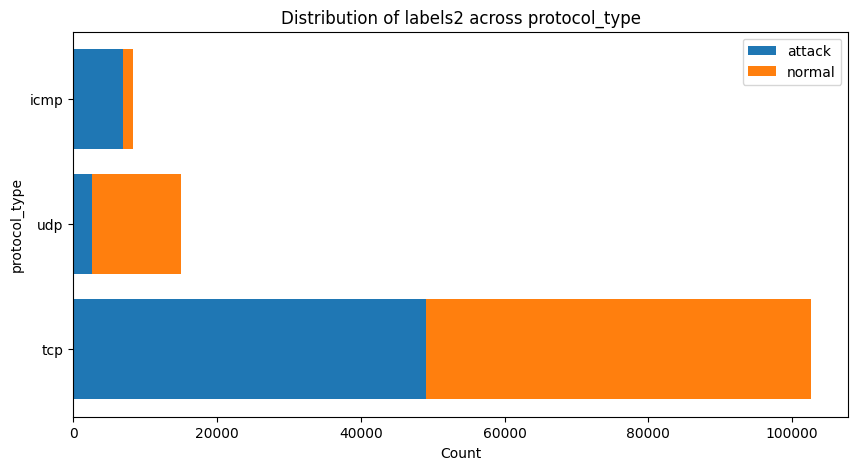

In [33]:
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(10, 5))
nominal_col = nominal_cols[0]
label2_col = 'labels2'

# Create a DataFrame with the counts for each label within each nominal value
counts2_df = train_df.groupBy(nominal_col, label2_col).count().sort(nominal_col, label2_col)



# Pivot the DataFrame so that each nominal value has a row with the count for each label
pivoted2_df = counts2_df.groupBy(nominal_col).pivot(label2_col).sum('count').fillna(0)
x_labels2 = pivoted2_df.select(nominal_col).rdd.flatMap(lambda x: x).collect()
# Create a list of numpy arrays containing the counts for each label
label2_counts = [pivoted2_df.select(label2_col).rdd.flatMap(lambda x: x).collect() for label2_col in pivoted2_df.columns[1:]]

# Create the stacked bar chart
fig, ax = plt.subplots(figsize=(10, 5))
ax.barh(x_labels2, label2_counts[0], label='attack')
for i in range(1, len(label_counts)):
    ax.barh(x_labels2, label2_counts[i], left=np.sum(label2_counts[:i], axis=0), label=pivoted2_df.columns[i+1], color=f'C{i}')
ax.set_xlabel('Count')
ax.set_ylabel(nominal_col)
ax.set_title(f'Distribution of {label2_col} across {nominal_col}')
ax.legend()
plt.show()

In [34]:

(train_df.crosstab(nominal_cols[0], 'labels5').sort(sql.asc(nominal_cols[0] + '_labels5')).show())

23/05/12 21:44:18 INFO DAGScheduler: Registering RDD 266 (crosstab at NativeMethodAccessorImpl.java:0) as input to shuffle 29
23/05/12 21:44:18 INFO DAGScheduler: Got map stage job 58 (crosstab at NativeMethodAccessorImpl.java:0) with 8 output partitions
23/05/12 21:44:18 INFO DAGScheduler: Final stage: ShuffleMapStage 104 (crosstab at NativeMethodAccessorImpl.java:0)
23/05/12 21:44:18 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:44:18 INFO DAGScheduler: Missing parents: List()
23/05/12 21:44:18 INFO DAGScheduler: Submitting ShuffleMapStage 104 (MapPartitionsRDD[266] at crosstab at NativeMethodAccessorImpl.java:0), which has no missing parents
23/05/12 21:44:18 INFO MemoryStore: Block broadcast_60 stored as values in memory (estimated size 118.2 KiB, free 4.0 GiB)
23/05/12 21:44:18 INFO MemoryStore: Block broadcast_60_piece0 stored as bytes in memory (estimated size 39.9 KiB, free 4.0 GiB)
23/05/12 21:44:18 INFO BlockManagerInfo: Added broadcast_60_piece0 in memory on 

+---------------------+-----+-----+---+---+------+
|protocol_type_labels5|  DoS|Probe|R2L|U2R|normal|
+---------------------+-----+-----+---+---+------+
|                 icmp| 2847| 4135|  0|  0|  1309|
|                  tcp|42188| 5857|995| 49| 53600|
|                  udp|  892| 1664|  0|  3| 12434|
+---------------------+-----+-----+---+---+------+



23/05/12 21:44:19 INFO CodeGenerator: Code generated in 20.188959 ms
23/05/12 21:44:19 INFO CodeGenerator: Code generated in 12.473458 ms


23/05/12 21:44:20 INFO HashAggregateExec: spark.sql.codegen.aggregate.map.twolevel.enabled is set to true, but current version of codegened fast hashmap does not support this aggregate.
23/05/12 21:44:20 INFO DAGScheduler: Registering RDD 295 (pivot at NativeMethodAccessorImpl.java:0) as input to shuffle 33
23/05/12 21:44:20 INFO DAGScheduler: Got map stage job 65 (pivot at NativeMethodAccessorImpl.java:0) with 8 output partitions
23/05/12 21:44:20 INFO DAGScheduler: Final stage: ShuffleMapStage 118 (pivot at NativeMethodAccessorImpl.java:0)
23/05/12 21:44:20 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:44:20 INFO DAGScheduler: Missing parents: List()
23/05/12 21:44:20 INFO DAGScheduler: Submitting ShuffleMapStage 118 (MapPartitionsRDD[295] at pivot at NativeMethodAccessorImpl.java:0), which has no missing parents
23/05/12 21:44:20 INFO MemoryStore: Block broadcast_67 stored as values in memory (estimated size 116.0 KiB, free 4.0 GiB)
23/05/12 21:44:20 INFO MemoryStore

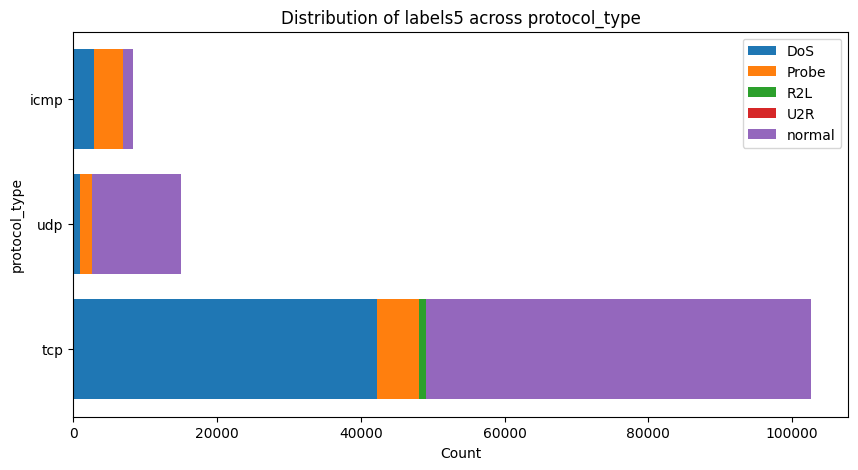

In [35]:
import matplotlib.pyplot as plt
import numpy as np

# Define the nominal column and label column
nominal_col = 'protocol_type'
label_col = 'labels5'

# Create a DataFrame with the counts for each label within each nominal value
counts_df = train_df.groupBy(nominal_col, label_col).count().sort(nominal_col, label_col)

# Pivot the DataFrame so that each nominal value has a row with the count for each label
pivoted_df = counts_df.groupBy(nominal_col).pivot(label_col).sum('count').fillna(1)

# Create a list of labels for the x-axis
x_labels = pivoted_df.select(nominal_col).rdd.flatMap(lambda x: x).collect()

# Create a list of numpy arrays containing the counts for each label
label_counts = [pivoted_df.select(label_col).rdd.flatMap(lambda x: x).collect() for label_col in pivoted_df.columns[1:]]

# Create the stacked bar chart
fig, ax = plt.subplots(figsize=(10, 5))
ax.barh(x_labels, label_counts[0], label='DoS')
for i in range(1, len(label_counts)):
    ax.barh(x_labels, label_counts[i], left=np.sum(label_counts[:i], axis=0), label=pivoted_df.columns[i+1], color=f'C{i}')
ax.set_xlabel('Count')
ax.set_ylabel(nominal_col)
ax.set_title(f'Distribution of {label_col} across {nominal_col}')
ax.legend()
plt.show()


In [36]:
# 'service' nominal column
print(train_df.select(nominal_cols[1]).distinct().count())
(train_df.crosstab(nominal_cols[1], 'labels2').sort(sql.asc(nominal_cols[1] + '_labels2')).show(n=70))
(train_df.crosstab(nominal_cols[1], 'labels5').sort(sql.asc(nominal_cols[1] + '_labels5')).show(n=70))

23/05/12 21:44:23 INFO HashAggregateExec: spark.sql.codegen.aggregate.map.twolevel.enabled is set to true, but current version of codegened fast hashmap does not support this aggregate.
23/05/12 21:44:24 INFO CodeGenerator: Code generated in 25.61775 ms
23/05/12 21:44:24 INFO DAGScheduler: Registering RDD 401 (count at NativeMethodAccessorImpl.java:0) as input to shuffle 48
23/05/12 21:44:24 INFO DAGScheduler: Got map stage job 88 (count at NativeMethodAccessorImpl.java:0) with 8 output partitions
23/05/12 21:44:24 INFO DAGScheduler: Final stage: ShuffleMapStage 167 (count at NativeMethodAccessorImpl.java:0)
23/05/12 21:44:24 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:44:24 INFO DAGScheduler: Missing parents: List()
23/05/12 21:44:24 INFO DAGScheduler: Submitting ShuffleMapStage 167 (MapPartitionsRDD[401] at count at NativeMethodAccessorImpl.java:0), which has no missing parents
23/05/12 21:44:24 INFO MemoryStore: Block broadcast_90 stored as values in memory (estima

70


23/05/12 21:44:24 INFO DAGScheduler: Registering RDD 413 (crosstab at NativeMethodAccessorImpl.java:0) as input to shuffle 50
23/05/12 21:44:24 INFO DAGScheduler: Got map stage job 91 (crosstab at NativeMethodAccessorImpl.java:0) with 8 output partitions
23/05/12 21:44:24 INFO DAGScheduler: Final stage: ShuffleMapStage 173 (crosstab at NativeMethodAccessorImpl.java:0)
23/05/12 21:44:24 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:44:24 INFO DAGScheduler: Missing parents: List()
23/05/12 21:44:24 INFO DAGScheduler: Submitting ShuffleMapStage 173 (MapPartitionsRDD[413] at crosstab at NativeMethodAccessorImpl.java:0), which has no missing parents
23/05/12 21:44:24 INFO MemoryStore: Block broadcast_93 stored as values in memory (estimated size 118.2 KiB, free 4.0 GiB)
23/05/12 21:44:24 INFO MemoryStore: Block broadcast_93_piece0 stored as bytes in memory (estimated size 39.9 KiB, free 4.0 GiB)
23/05/12 21:44:24 INFO BlockManagerInfo: Added broadcast_93_piece0 in memory on 

+---------------+------+------+
|service_labels2|attack|normal|
+---------------+------+------+
|            IRC|     1|   186|
|            X11|     6|    67|
|         Z39_50|   862|     0|
|            aol|     2|     0|
|           auth|   719|   236|
|            bgp|   710|     0|
|        courier|   734|     0|
|       csnet_ns|   545|     0|
|            ctf|   563|     0|
|        daytime|   521|     0|
|        discard|   538|     0|
|         domain|   531|    38|
|       domain_u|     9|  9034|
|           echo|   434|     0|
|          eco_i|  4089|   497|
|          ecr_i|  2887|   190|
|            efs|   485|     0|
|           exec|   474|     0|
|         finger|  1222|   545|
|            ftp|   836|   918|
|       ftp_data|  1876|  4984|
|         gopher|   518|     0|
|        harvest|     2|     0|
|      hostnames|   460|     0|
|           http|  2289| 38049|
|      http_2784|     1|     0|
|       http_443|   530|     0|
|      http_8001|     2|     0|
|       

23/05/12 21:44:26 INFO DAGScheduler: Registering RDD 443 (crosstab at NativeMethodAccessorImpl.java:0) as input to shuffle 54
23/05/12 21:44:26 INFO DAGScheduler: Got map stage job 98 (crosstab at NativeMethodAccessorImpl.java:0) with 8 output partitions
23/05/12 21:44:26 INFO DAGScheduler: Final stage: ShuffleMapStage 187 (crosstab at NativeMethodAccessorImpl.java:0)
23/05/12 21:44:26 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:44:26 INFO DAGScheduler: Missing parents: List()
23/05/12 21:44:26 INFO DAGScheduler: Submitting ShuffleMapStage 187 (MapPartitionsRDD[443] at crosstab at NativeMethodAccessorImpl.java:0), which has no missing parents
23/05/12 21:44:26 INFO MemoryStore: Block broadcast_100 stored as values in memory (estimated size 118.2 KiB, free 4.0 GiB)
23/05/12 21:44:26 INFO MemoryStore: Block broadcast_100_piece0 stored as bytes in memory (estimated size 39.9 KiB, free 4.0 GiB)
23/05/12 21:44:26 INFO BlockManagerInfo: Added broadcast_100_piece0 in memory 

+---------------+-----+-----+---+---+------+
|service_labels5|  DoS|Probe|R2L|U2R|normal|
+---------------+-----+-----+---+---+------+
|            IRC|    0|    1|  0|  0|   186|
|            X11|    0|    6|  0|  0|    67|
|         Z39_50|  851|   11|  0|  0|     0|
|            aol|    0|    2|  0|  0|     0|
|           auth|  703|   16|  0|  0|   236|
|            bgp|  699|   11|  0|  0|     0|
|        courier|  726|    8|  0|  0|     0|
|       csnet_ns|  533|   12|  0|  0|     0|
|            ctf|  538|   25|  0|  0|     0|
|        daytime|  503|   18|  0|  0|     0|
|        discard|  520|   18|  0|  0|     0|
|         domain|  508|   23|  0|  0|    38|
|       domain_u|    0|    9|  0|  0|  9034|
|           echo|  416|   18|  0|  0|     0|
|          eco_i|    0| 4089|  0|  0|   497|
|          ecr_i| 2844|   43|  0|  0|   190|
|            efs|  478|    7|  0|  0|     0|
|           exec|  465|    9|  0|  0|     0|
|         finger| 1168|   54|  0|  0|   545|
|         

23/05/12 21:44:27 INFO Executor: Finished task 0.0 in stage 197.0 (TID 355). 6401 bytes result sent to driver
23/05/12 21:44:27 INFO TaskSetManager: Finished task 0.0 in stage 197.0 (TID 355) in 91 ms on 10.0.0.49 (executor driver) (1/1)
23/05/12 21:44:27 INFO TaskSchedulerImpl: Removed TaskSet 197.0, whose tasks have all completed, from pool 
23/05/12 21:44:27 INFO DAGScheduler: ShuffleMapStage 197 (showString at NativeMethodAccessorImpl.java:0) finished in 0.116 s
23/05/12 21:44:27 INFO DAGScheduler: looking for newly runnable stages
23/05/12 21:44:27 INFO DAGScheduler: running: Set()
23/05/12 21:44:27 INFO DAGScheduler: waiting: Set()
23/05/12 21:44:27 INFO DAGScheduler: failed: Set()
23/05/12 21:44:27 INFO ShufflePartitionsUtil: For shuffle(57), advisory target size: 67108864, actual target size 1048576, minimum partition size: 1048576
23/05/12 21:44:27 INFO SparkContext: Starting job: showString at NativeMethodAccessorImpl.java:0
23/05/12 21:44:27 INFO DAGScheduler: Got job 104 (s

In [37]:
# 'flag' nominal column
print(train_df.select(nominal_cols[2]).distinct().count())
(train_df.crosstab(nominal_cols[2], 'labels2').sort(sql.asc(nominal_cols[2] + '_labels2')).show())
(train_df.crosstab(nominal_cols[2], 'labels5').sort(sql.asc(nominal_cols[2] + '_labels5')).show())

23/05/12 21:44:27 INFO HashAggregateExec: spark.sql.codegen.aggregate.map.twolevel.enabled is set to true, but current version of codegened fast hashmap does not support this aggregate.
23/05/12 21:44:28 INFO DAGScheduler: Registering RDD 472 (count at NativeMethodAccessorImpl.java:0) as input to shuffle 58
23/05/12 21:44:28 INFO DAGScheduler: Got map stage job 105 (count at NativeMethodAccessorImpl.java:0) with 8 output partitions
23/05/12 21:44:28 INFO DAGScheduler: Final stage: ShuffleMapStage 201 (count at NativeMethodAccessorImpl.java:0)
23/05/12 21:44:28 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:44:28 INFO DAGScheduler: Missing parents: List()
23/05/12 21:44:28 INFO DAGScheduler: Submitting ShuffleMapStage 201 (MapPartitionsRDD[472] at count at NativeMethodAccessorImpl.java:0), which has no missing parents
23/05/12 21:44:28 INFO MemoryStore: Block broadcast_107 stored as values in memory (estimated size 115.5 KiB, free 4.0 GiB)
23/05/12 21:44:28 INFO MemorySto

11


23/05/12 21:44:28 INFO DAGScheduler: Registering RDD 484 (crosstab at NativeMethodAccessorImpl.java:0) as input to shuffle 60
23/05/12 21:44:28 INFO DAGScheduler: Got map stage job 108 (crosstab at NativeMethodAccessorImpl.java:0) with 8 output partitions
23/05/12 21:44:28 INFO DAGScheduler: Final stage: ShuffleMapStage 207 (crosstab at NativeMethodAccessorImpl.java:0)
23/05/12 21:44:28 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:44:28 INFO DAGScheduler: Missing parents: List()
23/05/12 21:44:28 INFO DAGScheduler: Submitting ShuffleMapStage 207 (MapPartitionsRDD[484] at crosstab at NativeMethodAccessorImpl.java:0), which has no missing parents
23/05/12 21:44:28 INFO MemoryStore: Block broadcast_110 stored as values in memory (estimated size 118.2 KiB, free 4.0 GiB)
23/05/12 21:44:28 INFO MemoryStore: Block broadcast_110_piece0 stored as bytes in memory (estimated size 39.8 KiB, free 4.0 GiB)
23/05/12 21:44:28 INFO BlockManagerInfo: Added broadcast_110_piece0 in memory

+------------+------+------+
|flag_labels2|attack|normal|
+------------+------+------+
|         OTH|    35|    11|
|         REJ|  8540|  2693|
|        RSTO|  1343|   219|
|      RSTOS0|   103|     0|
|        RSTR|  2275|   146|
|          S0| 34497|   354|
|          S1|     4|   361|
|          S2|     8|   119|
|          S3|     4|    45|
|          SF| 11552| 63393|
|          SH|   269|     2|
+------------+------+------+



23/05/12 21:44:30 INFO DAGScheduler: Registering RDD 514 (crosstab at NativeMethodAccessorImpl.java:0) as input to shuffle 64
23/05/12 21:44:30 INFO DAGScheduler: Got map stage job 115 (crosstab at NativeMethodAccessorImpl.java:0) with 8 output partitions
23/05/12 21:44:30 INFO DAGScheduler: Final stage: ShuffleMapStage 221 (crosstab at NativeMethodAccessorImpl.java:0)
23/05/12 21:44:30 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:44:30 INFO DAGScheduler: Missing parents: List()
23/05/12 21:44:30 INFO DAGScheduler: Submitting ShuffleMapStage 221 (MapPartitionsRDD[514] at crosstab at NativeMethodAccessorImpl.java:0), which has no missing parents
23/05/12 21:44:30 INFO MemoryStore: Block broadcast_117 stored as values in memory (estimated size 118.2 KiB, free 4.0 GiB)
23/05/12 21:44:30 INFO MemoryStore: Block broadcast_117_piece0 stored as bytes in memory (estimated size 39.9 KiB, free 4.0 GiB)
23/05/12 21:44:30 INFO BlockManagerInfo: Added broadcast_117_piece0 in memory

+------------+-----+-----+---+---+------+
|flag_labels5|  DoS|Probe|R2L|U2R|normal|
+------------+-----+-----+---+---+------+
|         OTH|    0|   35|  0|  0|    11|
|         REJ| 5671| 2869|  0|  0|  2693|
|        RSTO| 1216|   80| 46|  1|   219|
|      RSTOS0|    0|  103|  0|  0|     0|
|        RSTR|   90| 2180|  5|  0|   146|
|          S0|34344|  153|  0|  0|   354|
|          S1|    2|    1|  1|  0|   361|
|          S2|    5|    2|  1|  0|   119|
|          S3|    0|    1|  3|  0|    45|
|          SF| 4599| 5967|935| 51| 63393|
|          SH|    0|  265|  4|  0|     2|
+------------+-----+-----+---+---+------+



23/05/12 21:44:31 INFO MemoryStore: Block broadcast_123_piece0 stored as bytes in memory (estimated size 47.6 KiB, free 4.0 GiB)
23/05/12 21:44:31 INFO BlockManagerInfo: Added broadcast_123_piece0 in memory on 10.0.0.49:64347 (size: 47.6 KiB, free: 4.0 GiB)
23/05/12 21:44:31 INFO SparkContext: Created broadcast 123 from broadcast at DAGScheduler.scala:1535
23/05/12 21:44:31 INFO DAGScheduler: Submitting 1 missing tasks from ResultStage 234 (MapPartitionsRDD[538] at showString at NativeMethodAccessorImpl.java:0) (first 15 tasks are for partitions Vector(0))
23/05/12 21:44:31 INFO TaskSchedulerImpl: Adding task set 234.0 with 1 tasks resource profile 0
23/05/12 21:44:31 INFO TaskSetManager: Starting task 0.0 in stage 234.0 (TID 408) (10.0.0.49, executor driver, partition 0, NODE_LOCAL, 7363 bytes) 
23/05/12 21:44:31 INFO Executor: Running task 0.0 in stage 234.0 (TID 408)
23/05/12 21:44:31 INFO ShuffleBlockFetcherIterator: Getting 1 (1014.0 B) non-empty blocks including 1 (1014.0 B) loca

In [38]:
# Binary columns
(train_df.select(binary_cols).describe().toPandas().transpose())

23/05/12 21:44:32 INFO CodeGenerator: Code generated in 216.292458 ms
23/05/12 21:44:32 INFO DAGScheduler: Registering RDD 543 (toPandas at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/3065753721.py:2) as input to shuffle 68
23/05/12 21:44:32 INFO DAGScheduler: Got map stage job 122 (toPandas at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/3065753721.py:2) with 8 output partitions
23/05/12 21:44:32 INFO DAGScheduler: Final stage: ShuffleMapStage 235 (toPandas at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/3065753721.py:2)
23/05/12 21:44:32 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:44:32 INFO DAGScheduler: Missing parents: List()
23/05/12 21:44:32 INFO DAGScheduler: Submitting ShuffleMapStage 235 (MapPartitionsRDD[543] at toPandas at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/3065753721.py:2), which has no missing parents
23/05/12 21:44:32 INFO MemoryStore: Block broadcast_124 stored a

,0,1,2,3,4
summary,count,mean,stddev,min,max
land,125973,1.9845522453224102E-4,0.014086071671513094,0.0,1.0
logged_in,125973,0.3957355941352512,0.48901005300524175,0.0,1.0
root_shell,125973,0.0013415573178379495,0.03660284383979861,0.0,1.0
su_attempted,125973,0.0011034110483992602,0.04515438381386557,0.0,2.0
is_host_login,125973,7.938208981289641E-6,0.0028174827384191085,0.0,1.0
is_guest_login,125973,0.009422654060790804,0.09661232709143104,0.0,1.0


In [39]:
# 'su_attempted' should be a binary feature, but has 3 values
(train_df.crosstab('su_attempted', 'labels2').show())

23/05/12 21:44:33 INFO DAGScheduler: Registering RDD 552 (crosstab at NativeMethodAccessorImpl.java:0) as input to shuffle 69
23/05/12 21:44:33 INFO DAGScheduler: Got map stage job 124 (crosstab at NativeMethodAccessorImpl.java:0) with 8 output partitions
23/05/12 21:44:33 INFO DAGScheduler: Final stage: ShuffleMapStage 238 (crosstab at NativeMethodAccessorImpl.java:0)
23/05/12 21:44:33 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:44:33 INFO DAGScheduler: Missing parents: List()
23/05/12 21:44:33 INFO DAGScheduler: Submitting ShuffleMapStage 238 (MapPartitionsRDD[552] at crosstab at NativeMethodAccessorImpl.java:0), which has no missing parents
23/05/12 21:44:33 INFO MemoryStore: Block broadcast_126 stored as values in memory (estimated size 118.2 KiB, free 4.0 GiB)
23/05/12 21:44:33 INFO MemoryStore: Block broadcast_126_piece0 stored as bytes in memory (estimated size 39.9 KiB, free 4.0 GiB)
23/05/12 21:44:33 INFO BlockManagerInfo: Added broadcast_126_piece0 in memory

+--------------------+------+------+
|su_attempted_labels2|attack|normal|
+--------------------+------+------+
|                 1.0|     1|    20|
|                 0.0| 58629| 67264|
|                 2.0|     0|    59|
+--------------------+------+------+



23/05/12 21:44:34 INFO Executor: Finished task 0.0 in stage 251.0 (TID 438). 7821 bytes result sent to driver
23/05/12 21:44:34 INFO TaskSetManager: Finished task 0.0 in stage 251.0 (TID 438) in 54 ms on 10.0.0.49 (executor driver) (1/1)
23/05/12 21:44:34 INFO TaskSchedulerImpl: Removed TaskSet 251.0, whose tasks have all completed, from pool 
23/05/12 21:44:34 INFO DAGScheduler: ResultStage 251 (showString at NativeMethodAccessorImpl.java:0) finished in 0.076 s
23/05/12 21:44:34 INFO DAGScheduler: Job 130 is finished. Cancelling potential speculative or zombie tasks for this job
23/05/12 21:44:34 INFO TaskSchedulerImpl: Killing all running tasks in stage 251: Stage finished
23/05/12 21:44:34 INFO DAGScheduler: Job 130 finished: showString at NativeMethodAccessorImpl.java:0, took 0.089831 s


In [40]:
# '2.0' value is replaced to '0.0' for both train and test datasets
train_df = train_df.replace(2.0, 0.0, 'su_attempted')
test_df = test_df.replace(2.0, 0.0, 'su_attempted')

In [41]:
# Numeric columns
print(len(numeric_cols))
(train_df.select(numeric_cols).describe().toPandas().transpose())

32


23/05/12 21:44:35 INFO DAGScheduler: Registering RDD 580 (toPandas at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/1332209225.py:3) as input to shuffle 73
23/05/12 21:44:35 INFO DAGScheduler: Got map stage job 131 (toPandas at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/1332209225.py:3) with 8 output partitions
23/05/12 21:44:35 INFO DAGScheduler: Final stage: ShuffleMapStage 252 (toPandas at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/1332209225.py:3)
23/05/12 21:44:35 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:44:35 INFO DAGScheduler: Missing parents: List()
23/05/12 21:44:35 INFO DAGScheduler: Submitting ShuffleMapStage 252 (MapPartitionsRDD[580] at toPandas at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/1332209225.py:3), which has no missing parents
23/05/12 21:44:35 INFO MemoryStore: Block broadcast_133 stored as values in memory (estimated size 216.8 KiB, free 4.0 GiB)
23/05/12 2

,0,1,2,3,4
summary,count,mean,stddev,min,max
duration,125973,287.1446500440571,2604.515309867592,0.0,42908.0
src_bytes,125973,45566.74300048423,5870331.181893551,0.0,1.379963888E9
dst_bytes,125973,19779.114421344257,4021269.1514414474,0.0,1.309937401E9
wrong_fragment,125973,0.022687401268525795,0.25352998595201254,0.0,3.0
urgent,125973,1.1113492573805498E-4,0.014366026620154243,0.0,3.0
hot,125973,0.20440888126820828,2.1499684337047587,0.0,77.0
num_failed_logins,125973,0.0012224841831186047,0.045239138981329835,0.0,5.0
num_compromised,125973,0.279250315543807,23.942042242795125,0.0,7479.0
num_root,125973,0.30219173949973405,24.3996180888374,0.0,7468.0


In [42]:
(train_df.crosstab('num_outbound_cmds', 'labels2').show())

23/05/12 21:44:43 INFO DAGScheduler: Registering RDD 590 (crosstab at NativeMethodAccessorImpl.java:0) as input to shuffle 74
23/05/12 21:44:43 INFO DAGScheduler: Got map stage job 133 (crosstab at NativeMethodAccessorImpl.java:0) with 8 output partitions
23/05/12 21:44:43 INFO DAGScheduler: Final stage: ShuffleMapStage 255 (crosstab at NativeMethodAccessorImpl.java:0)
23/05/12 21:44:43 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:44:43 INFO DAGScheduler: Missing parents: List()
23/05/12 21:44:43 INFO DAGScheduler: Submitting ShuffleMapStage 255 (MapPartitionsRDD[590] at crosstab at NativeMethodAccessorImpl.java:0), which has no missing parents
23/05/12 21:44:43 INFO MemoryStore: Block broadcast_135 stored as values in memory (estimated size 118.2 KiB, free 4.0 GiB)
23/05/12 21:44:43 INFO MemoryStore: Block broadcast_135_piece0 stored as bytes in memory (estimated size 39.8 KiB, free 4.0 GiB)
23/05/12 21:44:43 INFO BlockManagerInfo: Added broadcast_135_piece0 in memory

+-------------------------+------+------+
|num_outbound_cmds_labels2|attack|normal|
+-------------------------+------+------+
|                      0.0| 58630| 67343|
+-------------------------+------+------+



23/05/12 21:44:44 INFO Executor: Finished task 0.0 in stage 268.0 (TID 468). 7759 bytes result sent to driver
23/05/12 21:44:44 INFO TaskSetManager: Finished task 0.0 in stage 268.0 (TID 468) in 79 ms on 10.0.0.49 (executor driver) (1/1)
23/05/12 21:44:44 INFO TaskSchedulerImpl: Removed TaskSet 268.0, whose tasks have all completed, from pool 
23/05/12 21:44:44 INFO DAGScheduler: ResultStage 268 (showString at NativeMethodAccessorImpl.java:0) finished in 0.116 s
23/05/12 21:44:44 INFO DAGScheduler: Job 139 is finished. Cancelling potential speculative or zombie tasks for this job
23/05/12 21:44:44 INFO TaskSchedulerImpl: Killing all running tasks in stage 268: Stage finished
23/05/12 21:44:44 INFO DAGScheduler: Job 139 finished: showString at NativeMethodAccessorImpl.java:0, took 0.136308 s


As 'num_outbound_cmds' feature takes only 0.0 values, so it is dropped as redundant.

In [43]:
train_df = train_df.drop('num_outbound_cmds')
test_df = test_df.drop('num_outbound_cmds')
numeric_cols.remove('num_outbound_cmds')

Commented code below is related to removing highly correlated features. However, it hasen't been tested a lot yet.

In [44]:
from pyspark.mllib.stat import Statistics
from pyspark.mllib.linalg import Vectors
from pyspark.ml.feature import VectorAssembler

t0 = time()
stat_assembler = VectorAssembler(
                 inputCols=numeric_cols,
                 outputCol='features')

stat_rdd = stat_assembler.transform(train_df).rdd.map(lambda row: row['features'].toArray())

pearson_corr = Statistics.corr(stat_rdd, method='pearson')
spearman_corr = Statistics.corr(stat_rdd, method='spearman')

print(time() - t0)

23/05/12 21:44:45 INFO CodeGenerator: Code generated in 142.405792 ms
23/05/12 21:44:45 INFO SparkContext: Starting job: first at RowMatrix.scala:62
23/05/12 21:44:45 INFO DAGScheduler: Got job 140 (first at RowMatrix.scala:62) with 1 output partitions
23/05/12 21:44:45 INFO DAGScheduler: Final stage: ResultStage 269 (first at RowMatrix.scala:62)
23/05/12 21:44:45 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:44:45 INFO DAGScheduler: Missing parents: List()
23/05/12 21:44:45 INFO DAGScheduler: Submitting ResultStage 269 (MapPartitionsRDD[622] at mapPartitions at PythonMLLibAPI.scala:1354), which has no missing parents
23/05/12 21:44:45 INFO MemoryStore: Block broadcast_142 stored as values in memory (estimated size 149.3 KiB, free 4.0 GiB)
23/05/12 21:44:45 INFO MemoryStore: Block broadcast_142_piece0 stored as bytes in memory (estimated size 48.0 KiB, free 4.0 GiB)
23/05/12 21:44:45 INFO BlockManagerInfo: Added broadcast_142_piece0 in memory on 10.0.0.49:64347 (size: 4

42.12427496910095


23/05/12 21:45:26 INFO Executor: Finished task 2.0 in stage 290.0 (TID 536). 1988 bytes result sent to driver
23/05/12 21:45:26 INFO Executor: Finished task 0.0 in stage 290.0 (TID 534). 1988 bytes result sent to driver
23/05/12 21:45:26 INFO Executor: Finished task 7.0 in stage 290.0 (TID 541). 1988 bytes result sent to driver
23/05/12 21:45:26 INFO Executor: Finished task 3.0 in stage 290.0 (TID 537). 1988 bytes result sent to driver
23/05/12 21:45:26 INFO Executor: Finished task 1.0 in stage 290.0 (TID 535). 1988 bytes result sent to driver
23/05/12 21:45:26 INFO Executor: Finished task 6.0 in stage 290.0 (TID 540). 1988 bytes result sent to driver
23/05/12 21:45:26 INFO Executor: Finished task 5.0 in stage 290.0 (TID 539). 1988 bytes result sent to driver
23/05/12 21:45:26 INFO Executor: Finished task 4.0 in stage 290.0 (TID 538). 1988 bytes result sent to driver
23/05/12 21:45:26 INFO TaskSetManager: Finished task 0.0 in stage 290.0 (TID 534) in 2690 ms on 10.0.0.49 (executor driv

<Axes: title={'center': 'Spearman'}>

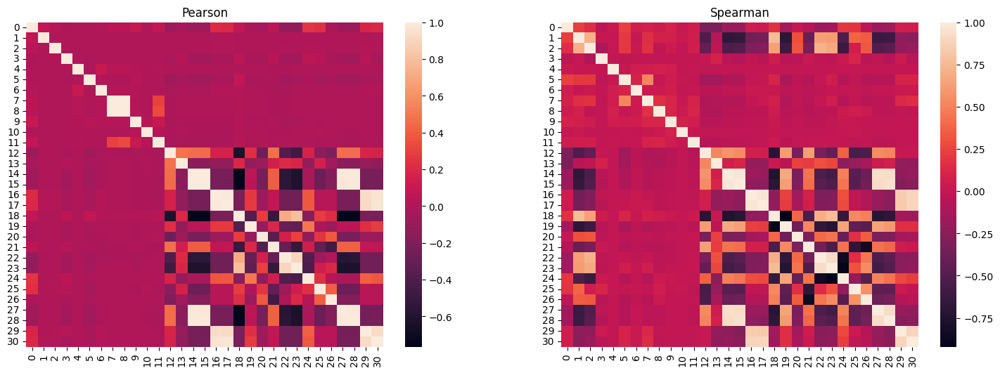

In [45]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))

ax1.set_title("Pearson")
ax2.set_title("Spearman")
sns.heatmap(pearson_corr, ax=ax1)
sns.heatmap(spearman_corr, ax=ax2)

In [46]:
inx_correlated_to_delete = [8, 15, 28, 17, 29]
# num_root ,srv_serror_rate, dst_host_srv_serror_rate, srv_rerror_rate , dst_host_rerror_rate
for inx in inx_correlated_to_delete:
    #print(numeric_cols[inx])
    train_df = train_df.drop(numeric_cols[inx])
    test_df = test_df.drop(numeric_cols[inx])

numeric_cols = [col for inx, col in enumerate(numeric_cols) if inx not in inx_correlated_to_delete]

train_df = train_df.cache()
test_df = test_df.cache()
print(train_df.count())
print(test_df.count())
print(len(numeric_cols))

23/05/12 21:45:28 INFO CodeGenerator: Code generated in 172.508417 ms
23/05/12 21:45:28 INFO DAGScheduler: Registering RDD 664 (count at NativeMethodAccessorImpl.java:0) as input to shuffle 84
23/05/12 21:45:28 INFO DAGScheduler: Got map stage job 150 (count at NativeMethodAccessorImpl.java:0) with 8 output partitions
23/05/12 21:45:28 INFO DAGScheduler: Final stage: ShuffleMapStage 292 (count at NativeMethodAccessorImpl.java:0)
23/05/12 21:45:28 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:45:28 INFO DAGScheduler: Missing parents: List()
23/05/12 21:45:28 INFO DAGScheduler: Submitting ShuffleMapStage 292 (MapPartitionsRDD[664] at count at NativeMethodAccessorImpl.java:0), which has no missing parents
23/05/12 21:45:28 INFO MemoryStore: Block broadcast_160 stored as values in memory (estimated size 127.9 KiB, free 4.0 GiB)
23/05/12 21:45:28 INFO MemoryStore: Block broadcast_160_piece0 stored as bytes in memory (estimated size 40.2 KiB, free 4.0 GiB)
23/05/12 21:45:28 I

125973


23/05/12 21:45:30 INFO MemoryStore: Block rdd_673_0 stored as values in memory (estimated size 791.6 KiB, free 4.0 GiB)
23/05/12 21:45:30 INFO MemoryStore: Block rdd_673_1 stored as values in memory (estimated size 791.4 KiB, free 4.0 GiB)
23/05/12 21:45:30 INFO MemoryStore: Block rdd_673_3 stored as values in memory (estimated size 791.0 KiB, free 4.0 GiB)
23/05/12 21:45:30 INFO MemoryStore: Block rdd_673_4 stored as values in memory (estimated size 791.3 KiB, free 4.0 GiB)
23/05/12 21:45:30 INFO MemoryStore: Block rdd_673_6 stored as values in memory (estimated size 791.6 KiB, free 4.0 GiB)
23/05/12 21:45:30 INFO MemoryStore: Block rdd_673_2 stored as values in memory (estimated size 790.8 KiB, free 4.0 GiB)
23/05/12 21:45:30 INFO BlockManagerInfo: Added rdd_673_3 in memory on 10.0.0.49:64347 (size: 791.0 KiB, free: 4.0 GiB)
23/05/12 21:45:30 INFO MemoryStore: Block rdd_673_7 stored as values in memory (estimated size 791.0 KiB, free 4.0 GiB)
23/05/12 21:45:30 INFO MemoryStore: Block

22544
26


23/05/12 21:45:30 INFO ShuffleBlockFetcherIterator: Getting 8 (480.0 B) non-empty blocks including 8 (480.0 B) local and 0 (0.0 B) host-local and 0 (0.0 B) push-merged-local and 0 (0.0 B) remote blocks
23/05/12 21:45:30 INFO ShuffleBlockFetcherIterator: Started 0 remote fetches in 3 ms
23/05/12 21:45:30 INFO Executor: Finished task 0.0 in stage 297.0 (TID 561). 3995 bytes result sent to driver
23/05/12 21:45:30 INFO TaskSetManager: Finished task 0.0 in stage 297.0 (TID 561) in 38 ms on 10.0.0.49 (executor driver) (1/1)
23/05/12 21:45:30 INFO TaskSchedulerImpl: Removed TaskSet 297.0, whose tasks have all completed, from pool 
23/05/12 21:45:30 INFO DAGScheduler: ResultStage 297 (count at NativeMethodAccessorImpl.java:0) finished in 0.064 s
23/05/12 21:45:30 INFO DAGScheduler: Job 153 is finished. Cancelling potential speculative or zombie tasks for this job
23/05/12 21:45:30 INFO TaskSchedulerImpl: Killing all running tasks in stage 297: Stage finished
23/05/12 21:45:30 INFO DAGSchedule

## 4. One Hot Encoding for categorical variables

One Hot Encoding (OHE) is used for treating categorical variables. Custom function is created for demonstration purposes. However, it could be easily replaced by PySpark OneHotEncoder.

In [47]:
def ohe_vec(cat_dict, row):
    vec = np.zeros(len(cat_dict))
    vec[cat_dict[row]] = float(1.0)
    return vec.tolist()

def ohe(df, nominal_col):
    categories = (df.select(nominal_col)
                    .distinct()
                    .rdd.map(lambda row: row[0])
                    .collect())
    
    cat_dict = dict(zip(categories, range(len(categories))))
    
    udf_ohe_vec = udf(lambda row: ohe_vec(cat_dict, row), 
                      StructType([StructField(cat, DoubleType(), False) for cat in categories]))
    
    df = df.withColumn(nominal_col + '_ohe', udf_ohe_vec(col(nominal_col))).cache()
    
    nested_cols = [nominal_col + '_ohe.' + cat for cat in categories]
    ohe_cols = [nominal_col + '_' + cat for cat in categories]
        
    for new, old in zip(ohe_cols, nested_cols):
        df = df.withColumn(new, col(old))

    df = df.drop(nominal_col + '_ohe')
                   
    return df, ohe_cols

In [48]:
t0 = time()
train_ohe_cols = []

train_df, train_ohe_col0 = ohe(train_df, nominal_cols[0])
train_ohe_cols += train_ohe_col0

train_df, train_ohe_col1 = ohe(train_df, nominal_cols[1])
train_ohe_cols += train_ohe_col1

train_df, train_ohe_col2 = ohe(train_df, nominal_cols[2])
train_ohe_cols += train_ohe_col2

binary_cols += train_ohe_cols

train_df = train_df.cache()
print(f"Number of examples in train set: {train_df.count()}")
print(f"Time: {time() - t0:.2f}s")

23/05/12 21:45:30 INFO HashAggregateExec: spark.sql.codegen.aggregate.map.twolevel.enabled is set to true, but current version of codegened fast hashmap does not support this aggregate.
23/05/12 21:45:30 INFO DAGScheduler: Registering RDD 686 (javaToPython at NativeMethodAccessorImpl.java:0) as input to shuffle 86
23/05/12 21:45:30 INFO DAGScheduler: Got map stage job 154 (javaToPython at NativeMethodAccessorImpl.java:0) with 8 output partitions
23/05/12 21:45:30 INFO DAGScheduler: Final stage: ShuffleMapStage 298 (javaToPython at NativeMethodAccessorImpl.java:0)
23/05/12 21:45:30 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:45:30 INFO DAGScheduler: Missing parents: List()
23/05/12 21:45:30 INFO DAGScheduler: Submitting ShuffleMapStage 298 (MapPartitionsRDD[686] at javaToPython at NativeMethodAccessorImpl.java:0), which has no missing parents
23/05/12 21:45:30 INFO MemoryStore: Block broadcast_164 stored as values in memory (estimated size 133.2 KiB, free 4.0 GiB)
23/0

Number of examples in train set: 125973
Time: 24.44s


23/05/12 21:45:54 INFO SparkContext: Starting job: count at NativeMethodAccessorImpl.java:0
23/05/12 21:45:54 INFO DAGScheduler: Got job 161 (count at NativeMethodAccessorImpl.java:0) with 1 output partitions
23/05/12 21:45:54 INFO DAGScheduler: Final stage: ResultStage 309 (count at NativeMethodAccessorImpl.java:0)
23/05/12 21:45:54 INFO DAGScheduler: Parents of final stage: List(ShuffleMapStage 308)
23/05/12 21:45:54 INFO DAGScheduler: Missing parents: List()
23/05/12 21:45:54 INFO DAGScheduler: Submitting ResultStage 309 (MapPartitionsRDD[752] at count at NativeMethodAccessorImpl.java:0), which has no missing parents
23/05/12 21:45:54 INFO MemoryStore: Block broadcast_171 stored as values in memory (estimated size 12.1 KiB, free 3.6 GiB)
23/05/12 21:45:54 INFO MemoryStore: Block broadcast_171_piece0 stored as bytes in memory (estimated size 5.8 KiB, free 3.6 GiB)
23/05/12 21:45:54 INFO BlockManagerInfo: Added broadcast_171_piece0 in memory on 10.0.0.49:64347 (size: 5.8 KiB, free: 3.

Custom list of test binary cols is used as test dataset could contain additional categories for 'service' and 'flag' features. However, those additional categories aren't used below.

In [49]:
t0 = time()
test_ohe_cols = []

test_df, test_ohe_col0_names = ohe(test_df, nominal_cols[0])
test_ohe_cols += test_ohe_col0_names

test_df, test_ohe_col1_names = ohe(test_df, nominal_cols[1])
test_ohe_cols += test_ohe_col1_names

test_df, test_ohe_col2_names = ohe(test_df, nominal_cols[2])
test_ohe_cols += test_ohe_col2_names

test_binary_cols = col_names[binary_inx].tolist() + test_ohe_cols

test_df = test_df.cache()
print(f"Number of examples in test set: {test_df.count()}")
print(f"Time: {time() - t0:.2f}s")

23/05/12 21:45:55 INFO HashAggregateExec: spark.sql.codegen.aggregate.map.twolevel.enabled is set to true, but current version of codegened fast hashmap does not support this aggregate.
23/05/12 21:45:55 INFO DAGScheduler: Registering RDD 757 (javaToPython at NativeMethodAccessorImpl.java:0) as input to shuffle 90
23/05/12 21:45:55 INFO DAGScheduler: Got map stage job 162 (javaToPython at NativeMethodAccessorImpl.java:0) with 8 output partitions
23/05/12 21:45:55 INFO DAGScheduler: Final stage: ShuffleMapStage 310 (javaToPython at NativeMethodAccessorImpl.java:0)
23/05/12 21:45:55 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:45:55 INFO DAGScheduler: Missing parents: List()
23/05/12 21:45:55 INFO DAGScheduler: Submitting ShuffleMapStage 310 (MapPartitionsRDD[757] at javaToPython at NativeMethodAccessorImpl.java:0), which has no missing parents
23/05/12 21:45:55 INFO MemoryStore: Block broadcast_172 stored as values in memory (estimated size 133.2 KiB, free 3.6 GiB)
23/0

Number of examples in test set: 22544
Time: 9.78s


## 5. Feature Selection using Attribute Ratio

Attribute Ratio approach is used for feature selection purposes. 


In [50]:
def getAttributeRatio(df, numericCols, binaryCols, labelCol):
    ratio_dict = {}
    
    if numericCols:
        avg_dict = (df
                .select(list(map(lambda c: sql.avg(c).alias(c), numericCols)))
                .first()
                .asDict())

        ratio_dict.update(df
                .groupBy(labelCol)
                .avg(*numericCols)
                .select(list(map(lambda c: sql.max(col('avg(' + c + ')')/avg_dict[c]).alias(c), numericCols)))
                .fillna(0.0)
                .first()
                .asDict())
    
    if binaryCols:
        ratio_dict.update((df
                .groupBy(labelCol)
                .agg(*list(map(lambda c: (sql.sum(col(c))/(sql.count(col(c)) - sql.sum(col(c)))).alias(c), binaryCols)))
                .fillna(1000.0)
                .select(*list(map(lambda c: sql.max(col(c)).alias(c), binaryCols)))
                .first()
                .asDict()))
        
    return OrderedDict(sorted(ratio_dict.items(), key=lambda v: -v[1]))

def selectFeaturesByAR(ar_dict, min_ar):
    return [f for f in ar_dict.keys() if ar_dict[f] >= min_ar]

In [51]:
t0 = time()
ar_dict = getAttributeRatio(train_df, numeric_cols, binary_cols, 'labels5')

print(f"Number of features in Attribute Ration dict: {len(ar_dict)}")
print(f"Time: {time() - t0:.2f}s")
ar_dict

23/05/12 21:46:05 INFO CodeGenerator: Code generated in 77.685917 ms
23/05/12 21:46:05 INFO DAGScheduler: Registering RDD 828 (first at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/1729132106.py:7) as input to shuffle 94
23/05/12 21:46:05 INFO DAGScheduler: Got map stage job 170 (first at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/1729132106.py:7) with 8 output partitions
23/05/12 21:46:05 INFO DAGScheduler: Final stage: ShuffleMapStage 322 (first at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/1729132106.py:7)
23/05/12 21:46:05 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:46:05 INFO DAGScheduler: Missing parents: List()
23/05/12 21:46:05 INFO DAGScheduler: Submitting ShuffleMapStage 322 (MapPartitionsRDD[828] at first at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/1729132106.py:7), which has no missing parents
23/05/12 21:46:05 INFO MemoryStore: Block broadcast_180 stored as values in m

Number of features in Attribute Ration dict: 116
Time: 12.07s


OrderedDict([('protocol_type_tcp', 1000.0),
             ('num_shells', 326.11353550295854),
             ('urgent', 173.03983516483518),
             ('num_file_creations', 62.23362492770388),
             ('flag_SF', 51.0),
             ('num_failed_logins', 46.03855641845592),
             ('hot', 40.77451681709518),
             ('logged_in', 10.569767441860465),
             ('dst_bytes', 9.154854355343401),
             ('src_bytes', 8.464064204948945),
             ('duration', 7.225829157212557),
             ('dst_host_srv_diff_host_rate', 5.756880682756574),
             ('dst_host_diff_srv_rate', 4.83734184897426),
             ('num_access_files', 4.694879248658319),
             ('dst_host_same_src_port_rate', 4.393080378884017),
             ('num_compromised', 4.338539274983927),
             ('diff_srv_rate', 4.069085485070395),
             ('dst_host_srv_rerror_rate', 3.667920527965924),
             ('rerror_rate', 3.645586087828447),
             ('srv_diff_host_rat

## 6. Data preparation

Custom standartization is created for demonstration purposes, so it could be easily replaced by PySpark StandardScaler. 

In [52]:
t0 = time()
avg_dict = (train_df.select(list(map(lambda c: sql.avg(c).alias(c), numeric_cols))).first().asDict())
std_dict = (train_df.select(list(map(lambda c: sql.stddev(c).alias(c), numeric_cols))).first().asDict())

def standardizer(column):
    return ((col(column) - avg_dict[column])/std_dict[column]).alias(column)

# Standardizer without mean
# def standardizer(column):
#     return (col(column)/std_dict[column]).alias(column)

train_scaler = [*binary_cols, *list(map(standardizer, numeric_cols)), *['id', 'labels2_index', 'labels2', 'labels5_index', 'labels5']]
test_scaler = [*test_binary_cols, *list(map(standardizer, numeric_cols)), *['id', 'labels2_index', 'labels2', 'labels5_index', 'labels5']]

scaled_train_df = (train_df.select(train_scaler).cache())
scaled_test_df = (test_df.select(test_scaler).cache())

print(scaled_train_df.count())
print(scaled_test_df.count())
print(f"Time: {time() - t0:.2f}s")

23/05/12 21:46:17 INFO DAGScheduler: Registering RDD 859 (first at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/2488929672.py:2) as input to shuffle 99
23/05/12 21:46:17 INFO DAGScheduler: Got map stage job 178 (first at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/2488929672.py:2) with 8 output partitions
23/05/12 21:46:17 INFO DAGScheduler: Final stage: ShuffleMapStage 337 (first at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/2488929672.py:2)
23/05/12 21:46:17 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:46:17 INFO DAGScheduler: Missing parents: List()
23/05/12 21:46:17 INFO DAGScheduler: Submitting ShuffleMapStage 337 (MapPartitionsRDD[859] at first at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/2488929672.py:2), which has no missing parents
23/05/12 21:46:17 INFO MemoryStore: Block broadcast_188 stored as values in memory (estimated size 260.9 KiB, free 3.6 GiB)
23/05/12 21:46:17 INFO

125973


23/05/12 21:46:26 INFO DAGScheduler: Registering RDD 895 (count at NativeMethodAccessorImpl.java:0) as input to shuffle 102
23/05/12 21:46:26 INFO DAGScheduler: Got map stage job 184 (count at NativeMethodAccessorImpl.java:0) with 8 output partitions
23/05/12 21:46:26 INFO DAGScheduler: Final stage: ShuffleMapStage 346 (count at NativeMethodAccessorImpl.java:0)
23/05/12 21:46:26 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:46:26 INFO DAGScheduler: Missing parents: List()
23/05/12 21:46:26 INFO DAGScheduler: Submitting ShuffleMapStage 346 (MapPartitionsRDD[895] at count at NativeMethodAccessorImpl.java:0), which has no missing parents
23/05/12 21:46:26 INFO MemoryStore: Block broadcast_194 stored as values in memory (estimated size 210.9 KiB, free 3.5 GiB)
23/05/12 21:46:26 INFO MemoryStore: Block broadcast_194_piece0 stored as bytes in memory (estimated size 64.8 KiB, free 3.5 GiB)
23/05/12 21:46:26 INFO BlockManagerInfo: Added broadcast_194_piece0 in memory on 10.0.0.

22544
Time: 10.82s


23/05/12 21:46:27 INFO MemoryStore: Block rdd_890_6 stored as values in memory (estimated size 2.4 MiB, free 3.5 GiB)
23/05/12 21:46:27 INFO BlockManagerInfo: Added rdd_890_6 in memory on 10.0.0.49:64347 (size: 2.4 MiB, free: 3.5 GiB)
23/05/12 21:46:27 INFO Executor: Finished task 6.0 in stage 346.0 (TID 696). 4274 bytes result sent to driver
23/05/12 21:46:27 INFO TaskSetManager: Finished task 6.0 in stage 346.0 (TID 696) in 984 ms on 10.0.0.49 (executor driver) (1/8)
23/05/12 21:46:27 INFO MemoryStore: Block rdd_890_5 stored as values in memory (estimated size 2.4 MiB, free 3.5 GiB)
23/05/12 21:46:27 INFO BlockManagerInfo: Added rdd_890_5 in memory on 10.0.0.49:64347 (size: 2.4 MiB, free: 3.5 GiB)
23/05/12 21:46:27 INFO Executor: Finished task 5.0 in stage 346.0 (TID 695). 4231 bytes result sent to driver
23/05/12 21:46:27 INFO MemoryStore: Block rdd_890_7 stored as values in memory (estimated size 2.4 MiB, free 3.5 GiB)
23/05/12 21:46:27 INFO MemoryStore: Block rdd_890_1 stored as v

VectorAssembler is used for combining a given list of columns into a single vector column. Then VectorIndexer is used for indexing categorical (binary) features. Indexing categorical features allows algorithms to treat them appropriately, improving performance.

In [53]:
from pyspark.ml.feature import VectorIndexer, VectorAssembler
assembler = VectorAssembler(inputCols=selectFeaturesByAR(ar_dict, 0.01), outputCol='raw_features')
indexer = VectorIndexer(inputCol='raw_features', outputCol='indexed_features', maxCategories=2)

prep_pipeline = Pipeline(stages=[assembler, indexer])
prep_model = prep_pipeline.fit(scaled_train_df)

23/05/12 21:46:28 INFO CodeGenerator: Code generated in 64.863208 ms
23/05/12 21:46:28 INFO SparkContext: Starting job: treeReduce at VectorIndexer.scala:150
23/05/12 21:46:28 INFO DAGScheduler: Registering RDD 910 (treeReduce at VectorIndexer.scala:150) as input to shuffle 103
23/05/12 21:46:28 INFO DAGScheduler: Got job 186 (treeReduce at VectorIndexer.scala:150) with 2 output partitions
23/05/12 21:46:28 INFO DAGScheduler: Final stage: ResultStage 350 (treeReduce at VectorIndexer.scala:150)
23/05/12 21:46:28 INFO DAGScheduler: Parents of final stage: List(ShuffleMapStage 349)
23/05/12 21:46:28 INFO DAGScheduler: Missing parents: List(ShuffleMapStage 349)
23/05/12 21:46:28 INFO DAGScheduler: Submitting ShuffleMapStage 349 (MapPartitionsRDD[910] at treeReduce at VectorIndexer.scala:150), which has no missing parents
23/05/12 21:46:28 INFO MemoryStore: Block broadcast_196 stored as values in memory (estimated size 279.5 KiB, free 3.4 GiB)
23/05/12 21:46:28 INFO MemoryStore: Block broad

In [54]:
t0 = time()
scaled_train_df = (prep_model
        .transform(scaled_train_df)
        .select('id', 'indexed_features', 'labels2_index', 'labels2', 'labels5_index', 'labels5')
        .cache())

scaled_test_df = (prep_model 
        .transform(scaled_test_df)
        .select('id', 'indexed_features','labels2_index', 'labels2', 'labels5_index', 'labels5')
        .cache())

print(scaled_train_df.count())
print(scaled_test_df.count())
print(f"Time: {time() - t0:.2f}s")

23/05/12 21:46:30 INFO BlockManagerInfo: Removed broadcast_197_piece0 on 10.0.0.49:64347 in memory (size: 85.7 KiB, free: 3.4 GiB)
23/05/12 21:46:30 INFO BlockManagerInfo: Removed broadcast_196_piece0 on 10.0.0.49:64347 in memory (size: 85.1 KiB, free: 3.4 GiB)
23/05/12 21:46:31 INFO CodeGenerator: Code generated in 149.190084 ms
23/05/12 21:46:31 INFO DAGScheduler: Registering RDD 923 (count at NativeMethodAccessorImpl.java:0) as input to shuffle 104
23/05/12 21:46:31 INFO DAGScheduler: Got map stage job 187 (count at NativeMethodAccessorImpl.java:0) with 8 output partitions
23/05/12 21:46:31 INFO DAGScheduler: Final stage: ShuffleMapStage 351 (count at NativeMethodAccessorImpl.java:0)
23/05/12 21:46:31 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:46:31 INFO DAGScheduler: Missing parents: List()
23/05/12 21:46:31 INFO DAGScheduler: Submitting ShuffleMapStage 351 (MapPartitionsRDD[923] at count at NativeMethodAccessorImpl.java:0), which has no missing parents
23/05/12 

125973


23/05/12 21:46:33 INFO DAGScheduler: Registering RDD 937 (count at NativeMethodAccessorImpl.java:0) as input to shuffle 105
23/05/12 21:46:33 INFO DAGScheduler: Got map stage job 189 (count at NativeMethodAccessorImpl.java:0) with 8 output partitions
23/05/12 21:46:33 INFO DAGScheduler: Final stage: ShuffleMapStage 354 (count at NativeMethodAccessorImpl.java:0)
23/05/12 21:46:33 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:46:33 INFO DAGScheduler: Missing parents: List()
23/05/12 21:46:33 INFO DAGScheduler: Submitting ShuffleMapStage 354 (MapPartitionsRDD[937] at count at NativeMethodAccessorImpl.java:0), which has no missing parents
23/05/12 21:46:33 INFO MemoryStore: Block broadcast_200 stored as values in memory (estimated size 287.0 KiB, free 3.4 GiB)
23/05/12 21:46:33 INFO MemoryStore: Block broadcast_200_piece0 stored as bytes in memory (estimated size 85.7 KiB, free 3.4 GiB)
23/05/12 21:46:33 INFO BlockManagerInfo: Added broadcast_200_piece0 in memory on 10.0.0.

22544
Time: 4.16s


23/05/12 21:46:34 INFO SparkContext: Starting job: count at NativeMethodAccessorImpl.java:0
23/05/12 21:46:34 INFO DAGScheduler: Got job 190 (count at NativeMethodAccessorImpl.java:0) with 1 output partitions
23/05/12 21:46:34 INFO DAGScheduler: Final stage: ResultStage 356 (count at NativeMethodAccessorImpl.java:0)
23/05/12 21:46:34 INFO DAGScheduler: Parents of final stage: List(ShuffleMapStage 355)
23/05/12 21:46:34 INFO DAGScheduler: Missing parents: List()
23/05/12 21:46:34 INFO DAGScheduler: Submitting ResultStage 356 (MapPartitionsRDD[940] at count at NativeMethodAccessorImpl.java:0), which has no missing parents
23/05/12 21:46:34 INFO MemoryStore: Block broadcast_201 stored as values in memory (estimated size 12.1 KiB, free 3.4 GiB)
23/05/12 21:46:34 INFO MemoryStore: Block broadcast_201_piece0 stored as bytes in memory (estimated size 5.9 KiB, free 3.4 GiB)
23/05/12 21:46:34 INFO BlockManagerInfo: Added broadcast_201_piece0 in memory on 10.0.0.49:64347 (size: 5.9 KiB, free: 3.

In [55]:
# Setting seed for reproducibility
seed = 4667979835606274383
print(seed)

4667979835606274383


The train dataset is splitted into 80% train and 20% cross-validation sets.

In [56]:
split = (scaled_train_df.randomSplit([0.8, 0.2], seed=seed))

scaled_train_df = split[0].cache()
scaled_cv_df = split[1].cache()

print(scaled_train_df.count())
print(scaled_cv_df.count())

23/05/12 21:46:34 INFO CodeGenerator: Code generated in 50.856333 ms
23/05/12 21:46:34 INFO DAGScheduler: Registering RDD 951 (count at NativeMethodAccessorImpl.java:0) as input to shuffle 106
23/05/12 21:46:34 INFO DAGScheduler: Got map stage job 191 (count at NativeMethodAccessorImpl.java:0) with 8 output partitions
23/05/12 21:46:34 INFO DAGScheduler: Final stage: ShuffleMapStage 357 (count at NativeMethodAccessorImpl.java:0)
23/05/12 21:46:34 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:46:34 INFO DAGScheduler: Missing parents: List()
23/05/12 21:46:34 INFO DAGScheduler: Submitting ShuffleMapStage 357 (MapPartitionsRDD[951] at count at NativeMethodAccessorImpl.java:0), which has no missing parents
23/05/12 21:46:34 INFO MemoryStore: Block broadcast_202 stored as values in memory (estimated size 301.3 KiB, free 3.4 GiB)
23/05/12 21:46:34 INFO MemoryStore: Block broadcast_202_piece0 stored as bytes in memory (estimated size 91.9 KiB, free 3.4 GiB)
23/05/12 21:46:34 I

100828


23/05/12 21:46:36 INFO CodeGenerator: Code generated in 19.758958 ms
23/05/12 21:46:36 INFO DAGScheduler: Registering RDD 965 (count at NativeMethodAccessorImpl.java:0) as input to shuffle 107
23/05/12 21:46:36 INFO DAGScheduler: Got map stage job 193 (count at NativeMethodAccessorImpl.java:0) with 8 output partitions
23/05/12 21:46:36 INFO DAGScheduler: Final stage: ShuffleMapStage 360 (count at NativeMethodAccessorImpl.java:0)
23/05/12 21:46:36 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:46:36 INFO DAGScheduler: Missing parents: List()
23/05/12 21:46:36 INFO DAGScheduler: Submitting ShuffleMapStage 360 (MapPartitionsRDD[965] at count at NativeMethodAccessorImpl.java:0), which has no missing parents
23/05/12 21:46:36 INFO MemoryStore: Block broadcast_204 stored as values in memory (estimated size 301.3 KiB, free 3.3 GiB)
23/05/12 21:46:36 INFO MemoryStore: Block broadcast_204_piece0 stored as bytes in memory (estimated size 91.9 KiB, free 3.3 GiB)
23/05/12 21:46:36 I

25145


23/05/12 21:46:36 INFO SparkContext: Starting job: count at NativeMethodAccessorImpl.java:0
23/05/12 21:46:36 INFO DAGScheduler: Got job 194 (count at NativeMethodAccessorImpl.java:0) with 1 output partitions
23/05/12 21:46:36 INFO DAGScheduler: Final stage: ResultStage 362 (count at NativeMethodAccessorImpl.java:0)
23/05/12 21:46:36 INFO DAGScheduler: Parents of final stage: List(ShuffleMapStage 361)
23/05/12 21:46:36 INFO DAGScheduler: Missing parents: List()
23/05/12 21:46:36 INFO DAGScheduler: Submitting ResultStage 362 (MapPartitionsRDD[968] at count at NativeMethodAccessorImpl.java:0), which has no missing parents
23/05/12 21:46:36 INFO MemoryStore: Block broadcast_205 stored as values in memory (estimated size 12.1 KiB, free 3.3 GiB)
23/05/12 21:46:36 INFO MemoryStore: Block broadcast_205_piece0 stored as bytes in memory (estimated size 5.8 KiB, free 3.3 GiB)
23/05/12 21:46:36 INFO BlockManagerInfo: Added broadcast_205_piece0 in memory on 10.0.0.49:64347 (size: 5.8 KiB, free: 3.

Additional "result" dataframes are used to collect probabilities and predictions from different approaches.

In [57]:
res_cv_df = scaled_cv_df.select(col('id'), col('labels2_index'), col('labels2'), col('labels5')).cache()
res_test_df = scaled_test_df.select(col('id'), col('labels2_index'), col('labels2'), col('labels5')).cache()
prob_cols = []
pred_cols = []

print(res_cv_df.count())
print(res_test_df.count())

23/05/12 21:46:36 INFO DAGScheduler: Registering RDD 978 (count at NativeMethodAccessorImpl.java:0) as input to shuffle 108
23/05/12 21:46:36 INFO DAGScheduler: Got map stage job 195 (count at NativeMethodAccessorImpl.java:0) with 8 output partitions
23/05/12 21:46:36 INFO DAGScheduler: Final stage: ShuffleMapStage 363 (count at NativeMethodAccessorImpl.java:0)
23/05/12 21:46:36 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:46:36 INFO DAGScheduler: Missing parents: List()
23/05/12 21:46:36 INFO DAGScheduler: Submitting ShuffleMapStage 363 (MapPartitionsRDD[978] at count at NativeMethodAccessorImpl.java:0), which has no missing parents
23/05/12 21:46:36 INFO MemoryStore: Block broadcast_206 stored as values in memory (estimated size 303.6 KiB, free 3.3 GiB)
23/05/12 21:46:36 INFO MemoryStore: Block broadcast_206_piece0 stored as bytes in memory (estimated size 92.3 KiB, free 3.3 GiB)
23/05/12 21:46:36 INFO BlockManagerInfo: Added broadcast_206_piece0 in memory on 10.0.0.

25145


23/05/12 21:46:37 INFO DAGScheduler: Registering RDD 991 (count at NativeMethodAccessorImpl.java:0) as input to shuffle 109
23/05/12 21:46:37 INFO DAGScheduler: Got map stage job 197 (count at NativeMethodAccessorImpl.java:0) with 8 output partitions
23/05/12 21:46:37 INFO DAGScheduler: Final stage: ShuffleMapStage 366 (count at NativeMethodAccessorImpl.java:0)
23/05/12 21:46:37 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:46:37 INFO DAGScheduler: Missing parents: List()
23/05/12 21:46:37 INFO DAGScheduler: Submitting ShuffleMapStage 366 (MapPartitionsRDD[991] at count at NativeMethodAccessorImpl.java:0), which has no missing parents
23/05/12 21:46:37 INFO MemoryStore: Block broadcast_208 stored as values in memory (estimated size 289.3 KiB, free 3.3 GiB)
23/05/12 21:46:37 INFO MemoryStore: Block broadcast_208_piece0 stored as bytes in memory (estimated size 86.6 KiB, free 3.3 GiB)
23/05/12 21:46:37 INFO BlockManagerInfo: Added broadcast_208_piece0 in memory on 10.0.0.

22544


23/05/12 21:46:37 INFO SparkContext: Starting job: count at NativeMethodAccessorImpl.java:0
23/05/12 21:46:37 INFO DAGScheduler: Got job 198 (count at NativeMethodAccessorImpl.java:0) with 1 output partitions
23/05/12 21:46:37 INFO DAGScheduler: Final stage: ResultStage 368 (count at NativeMethodAccessorImpl.java:0)
23/05/12 21:46:37 INFO DAGScheduler: Parents of final stage: List(ShuffleMapStage 367)
23/05/12 21:46:37 INFO DAGScheduler: Missing parents: List()
23/05/12 21:46:37 INFO DAGScheduler: Submitting ResultStage 368 (MapPartitionsRDD[994] at count at NativeMethodAccessorImpl.java:0), which has no missing parents
23/05/12 21:46:37 INFO MemoryStore: Block broadcast_209 stored as values in memory (estimated size 12.1 KiB, free 3.3 GiB)
23/05/12 21:46:37 INFO MemoryStore: Block broadcast_209_piece0 stored as bytes in memory (estimated size 5.8 KiB, free 3.3 GiB)
23/05/12 21:46:37 INFO BlockManagerInfo: Added broadcast_209_piece0 in memory on 10.0.0.49:64347 (size: 5.8 KiB, free: 3.

Different metrics from sklearn are used for evaluating results. The most important from them for this task are False positive Rate, Detection Rate and F1 score. 


In [58]:
import sklearn.metrics as metrics

def printCM(cm, labels):
    """pretty print for confusion matrixes"""
    columnwidth = max([len(x) for x in labels])
    # Print header
    print(" " * columnwidth, end="\t")
    for label in labels:
        print("%{0}s".format(columnwidth) % label, end="\t")
    print()
    # Print rows
    for i, label1 in enumerate(labels):
        print("%{0}s".format(columnwidth) % label1, end="\t")
        for j in range(len(labels)):
            print("%{0}d".format(columnwidth) % cm[i, j], end="\t")
        print()

def getPrediction(e):
    return udf(lambda row: 1.0 if row >= e else 0.0, DoubleType())
        
def printReport(resDF, probCol, labelCol='labels2_index', e=None, labels=['normal', 'attack']):
    if (e):
        predictionAndLabels = list(zip(*resDF.rdd
                                       .map(lambda row: (1.0 if row[probCol] >= e else 0.0, row[labelCol]))
                                       .collect()))
    else:
        predictionAndLabels = list(zip(*resDF.rdd
                                       .map(lambda row: (row[probCol], row[labelCol]))
                                       .collect()))
    
    cm = metrics.confusion_matrix(predictionAndLabels[1], predictionAndLabels[0])
    printCM(cm, labels)
    print(" ")
    print("Accuracy = %g" % (metrics.accuracy_score(predictionAndLabels[1], predictionAndLabels[0])))
    print("AUC = %g" % (metrics.roc_auc_score(predictionAndLabels[1], predictionAndLabels[0])))
    print(" ")
    print("False Alarm Rate = %g" % (cm[0][1]/(cm[0][0] + cm[0][1])))
    print("Detection Rate = %g" % (cm[1][1]/(cm[1][1] + cm[1][0])))
    print("F1 score = %g" % (metrics.f1_score(predictionAndLabels[1], predictionAndLabels[0])))
    print(" ")
    print(metrics.classification_report(predictionAndLabels[1], predictionAndLabels[0]))
    print(" ")

## 7. Visualization via PCA

PCA algorithm is used for visualization purposes. It's also used later as preprocessing for Gaussian Mixture clustering.

First graph shows 'attack' vs 'normal' labels, second graph shows 4 different types of attacks vs normal connections.

In [59]:
from pyspark.ml.feature import VectorSlicer
from pyspark.ml.feature import PCA

t0 = time()
pca_slicer = VectorSlicer(inputCol="indexed_features", outputCol="features", names=selectFeaturesByAR(ar_dict, 0.05))

pca = PCA(k=2, inputCol="features", outputCol="pca_features")
pca_pipeline = Pipeline(stages=[pca_slicer, pca])

pca_train_df = pca_pipeline.fit(scaled_train_df).transform(scaled_train_df)
print(f"Time: {time() - t0:.2f}s")

23/05/12 21:46:38 INFO CodeGenerator: Code generated in 62.110875 ms
23/05/12 21:46:38 INFO SparkContext: Starting job: first at PCA.scala:44
23/05/12 21:46:38 INFO DAGScheduler: Got job 199 (first at PCA.scala:44) with 1 output partitions
23/05/12 21:46:38 INFO DAGScheduler: Final stage: ResultStage 369 (first at PCA.scala:44)
23/05/12 21:46:38 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:46:38 INFO DAGScheduler: Missing parents: List()
23/05/12 21:46:38 INFO DAGScheduler: Submitting ResultStage 369 (MapPartitionsRDD[1002] at map at PCA.scala:89), which has no missing parents
23/05/12 21:46:38 INFO MemoryStore: Block broadcast_210 stored as values in memory (estimated size 313.1 KiB, free 3.3 GiB)
23/05/12 21:46:38 INFO MemoryStore: Block broadcast_210_piece0 stored as bytes in memory (estimated size 95.7 KiB, free 3.3 GiB)
23/05/12 21:46:38 INFO BlockManagerInfo: Added broadcast_210_piece0 in memory on 10.0.0.49:64347 (size: 95.7 KiB, free: 3.3 GiB)
23/05/12 21:46:38

Time: 2.82s


23/05/12 21:46:40 INFO CodeGenerator: Code generated in 52.982042 ms
23/05/12 21:46:40 INFO SparkContext: Starting job: collect at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/2625947648.py:2
23/05/12 21:46:40 INFO DAGScheduler: Got job 204 (collect at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/2625947648.py:2) with 8 output partitions
23/05/12 21:46:40 INFO DAGScheduler: Final stage: ResultStage 376 (collect at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/2625947648.py:2)
23/05/12 21:46:40 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:46:40 INFO DAGScheduler: Missing parents: List()
23/05/12 21:46:40 INFO DAGScheduler: Submitting ResultStage 376 (PythonRDD[1020] at collect at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/2625947648.py:2), which has no missing parents
23/05/12 21:46:40 INFO MemoryStore: Block broadcast_218 stored as values in memory (estimated size 331.1 KiB, free 3.3 GiB)


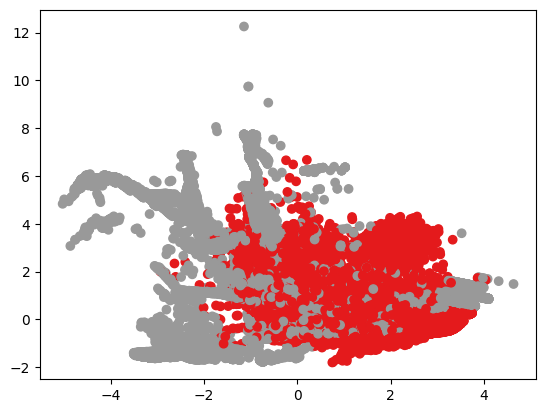

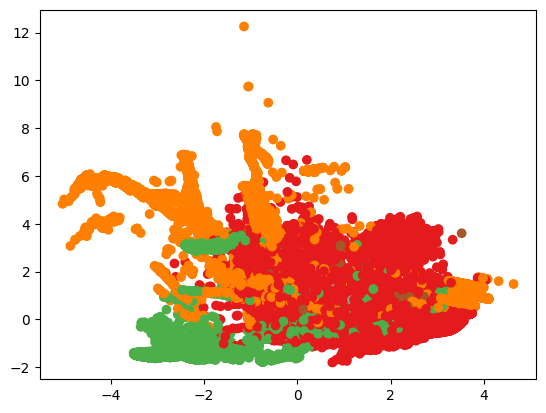

7.114566802978516


In [60]:
t0 = time()
viz_train_data = np.array(pca_train_df.rdd.map(lambda row: [*row['pca_features'], row['labels2_index'], row['labels5_index']]).collect())
plt.figure()
plt.scatter(x=viz_train_data[:,0], y=viz_train_data[:,1], c=viz_train_data[:,2], cmap="Set1")
plt.figure()
plt.scatter(x=viz_train_data[:,0], y=viz_train_data[:,1], c=viz_train_data[:,3], cmap="Set1")
plt.show()
print(time() - t0)

## 8. KMeans clustering with Random Forest Classifiers

The idea of the first approach is to clusterize data into clusters and then train different Random Forest classifiers for each of the clusters. 

As KMeans cannot truly handle binary/categorical features only numeric features are used for clustarization.

In [61]:
kmeans_prob_col = 'kmeans_rf_prob'
kmeans_pred_col = 'kmeans_rf_pred'

prob_cols.append(kmeans_prob_col)
pred_cols.append(kmeans_pred_col)

In [62]:
# KMeans clustrering
from pyspark.ml.clustering import KMeans

t0 = time()
kmeans_slicer = VectorSlicer(inputCol="indexed_features", outputCol="features", 
                             names=list(set(selectFeaturesByAR(ar_dict, 0.1)).intersection(numeric_cols)))

kmeans = KMeans(k=8, initSteps=25, maxIter=100, featuresCol="features", predictionCol="cluster", seed=seed)

kmeans_pipeline = Pipeline(stages=[kmeans_slicer, kmeans])

kmeans_model = kmeans_pipeline.fit(scaled_train_df)

kmeans_train_df = kmeans_model.transform(scaled_train_df).cache()
kmeans_cv_df = kmeans_model.transform(scaled_cv_df).cache()
kmeans_test_df = kmeans_model.transform(scaled_test_df).cache()

print(f"Time: {time() - t0:.2f}s")

23/05/12 21:46:48 INFO Instrumentation: [2638ceb9] Stage class: KMeans
23/05/12 21:46:48 INFO Instrumentation: [2638ceb9] Stage uid: KMeans_b4a6b0ddc012
23/05/12 21:46:48 INFO CodeGenerator: Code generated in 117.548916 ms
23/05/12 21:46:48 INFO Instrumentation: [2638ceb9] training: numPartitions=8 storageLevel=StorageLevel(1 replicas)
23/05/12 21:46:48 INFO Instrumentation: [2638ceb9] {"seed":4667979835606274383,"featuresCol":"features","initSteps":25,"predictionCol":"cluster","maxIter":100,"k":8}
23/05/12 21:46:49 INFO DAGScheduler: Registering RDD 1033 (first at KMeans.scala:410) as input to shuffle 112
23/05/12 21:46:49 INFO DAGScheduler: Got map stage job 205 (first at KMeans.scala:410) with 8 output partitions
23/05/12 21:46:49 INFO DAGScheduler: Final stage: ShuffleMapStage 377 (first at KMeans.scala:410)
23/05/12 21:46:49 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:46:49 INFO DAGScheduler: Missing parents: List()
23/05/12 21:46:49 INFO DAGScheduler: Submitting

Time: 18.86s


In [63]:
# Function for describing the contents of the clusters 
def getClusterCrosstab(df, clusterCol='cluster'):
    return (df.crosstab(clusterCol, 'labels2')
              .withColumn('count', col('attack') + col('normal'))
              .withColumn(clusterCol + '_labels2', col(clusterCol + '_labels2').cast('int'))
              .sort(col(clusterCol +'_labels2').asc()))

In [64]:
kmeans_crosstab = getClusterCrosstab(kmeans_train_df).cache()
kmeans_crosstab.show(n=30)

23/05/12 21:47:07 INFO CodeGenerator: Code generated in 15.002375 ms
23/05/12 21:47:07 INFO CodeGenerator: Code generated in 23.461541 ms
23/05/12 21:47:07 INFO DAGScheduler: Registering RDD 1206 (crosstab at NativeMethodAccessorImpl.java:0) as input to shuffle 131
23/05/12 21:47:07 INFO DAGScheduler: Got map stage job 278 (crosstab at NativeMethodAccessorImpl.java:0) with 8 output partitions
23/05/12 21:47:07 INFO DAGScheduler: Final stage: ShuffleMapStage 469 (crosstab at NativeMethodAccessorImpl.java:0)
23/05/12 21:47:07 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:47:07 INFO DAGScheduler: Missing parents: List()
23/05/12 21:47:07 INFO DAGScheduler: Submitting ShuffleMapStage 469 (MapPartitionsRDD[1206] at crosstab at NativeMethodAccessorImpl.java:0), which has no missing parents
23/05/12 21:47:07 INFO MemoryStore: Block broadcast_367 stored as values in memory (estimated size 340.3 KiB, free 3.3 GiB)
23/05/12 21:47:07 INFO MemoryStore: Block broadcast_367_piece0 st

+---------------+------+------+-----+
|cluster_labels2|attack|normal|count|
+---------------+------+------+-----+
|              0|  4749| 49368|54117|
|              1| 33047|   727|33774|
|              2|  2439|  1084| 3523|
|              3|     2|    40|   42|
|              4|  3695|   931| 4626|
|              5|     2|     7|    9|
|              6|     3|    32|   35|
|              7|  2952|  1750| 4702|
+---------------+------+------+-----+



23/05/12 21:47:15 INFO CodeGenerator: Code generated in 5.718625 ms


Clustres are splitted into two categories. Frist category contains clusters that have both 'attack' and 'normal' connections and have more than 25 connections. For the first category Random Forest classifiers are aplied. Second category contains all other clusters and maps cluster to 'attack' or 'normal' based on majority. All clusters that contains less or equal than 25 connections are treated as outliers and are mapped to 'attack' type.

In [65]:
# Function for splitting clusters
def splitClusters(crosstab):
    exp = ((col('count') > 25) & (col('attack') > 0) & (col('normal') > 0))

    cluster_rf = (crosstab
        .filter(exp).rdd
        .map(lambda row: (int(row['cluster_labels2']), [row['count'], row['attack']/row['count']]))
        .collectAsMap())

    cluster_mapping = (crosstab
        .filter(~exp).rdd
        .map(lambda row: (int(row['cluster_labels2']), 1.0 if (row['count'] <= 25) | (row['normal'] == 0) else 0.0))
        .collectAsMap())
    
    return cluster_rf, cluster_mapping

kmeans_cluster_rf, kmeans_cluster_mapping = splitClusters(kmeans_crosstab)

print(len(kmeans_cluster_rf), len(kmeans_cluster_mapping))
print(kmeans_cluster_mapping)
kmeans_cluster_rf

23/05/12 21:47:16 INFO CodeGenerator: Code generated in 29.6505 ms
23/05/12 21:47:16 INFO DefaultCachedBatchSerializer: Predicate (count#149096L > 25) generates partition filter: (25 < count.upperBound#149806L)
23/05/12 21:47:16 INFO DefaultCachedBatchSerializer: Predicate (attack#149091L > 0) generates partition filter: (0 < attack.upperBound#149796L)
23/05/12 21:47:16 INFO DefaultCachedBatchSerializer: Predicate (normal#149092L > 0) generates partition filter: (0 < normal.upperBound#149801L)
23/05/12 21:47:16 INFO SparkContext: Starting job: collectAsMap at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/1811622547.py:8
23/05/12 21:47:16 INFO DAGScheduler: Got job 286 (collectAsMap at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/1811622547.py:8) with 8 output partitions
23/05/12 21:47:16 INFO DAGScheduler: Final stage: ResultStage 495 (collectAsMap at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/1811622547.py:8)
23/05/12 21:47:

7 1
{5: 1.0}


23/05/12 21:47:17 INFO PythonRunner: Times: total = 105, boot = -373, init = 477, finish = 1
23/05/12 21:47:17 INFO PythonRunner: Times: total = 106, boot = -361, init = 467, finish = 0
23/05/12 21:47:17 INFO Executor: Finished task 5.0 in stage 499.0 (TID 2140). 10849 bytes result sent to driver
23/05/12 21:47:17 INFO Executor: Finished task 7.0 in stage 499.0 (TID 2142). 10841 bytes result sent to driver
23/05/12 21:47:17 INFO TaskSetManager: Finished task 5.0 in stage 499.0 (TID 2140) in 175 ms on 10.0.0.49 (executor driver) (1/8)
23/05/12 21:47:17 INFO TaskSetManager: Finished task 7.0 in stage 499.0 (TID 2142) in 176 ms on 10.0.0.49 (executor driver) (2/8)
23/05/12 21:47:17 INFO PythonRunner: Times: total = 115, boot = -363, init = 478, finish = 0
23/05/12 21:47:17 INFO Executor: Finished task 3.0 in stage 499.0 (TID 2138). 10798 bytes result sent to driver
23/05/12 21:47:17 INFO TaskSetManager: Finished task 3.0 in stage 499.0 (TID 2138) in 180 ms on 10.0.0.49 (executor driver) (

{0: [54117, 0.0877543101058817],
 1: [33774, 0.9784745662343814],
 2: [3523, 0.6923076923076923],
 3: [42, 0.047619047619047616],
 4: [4626, 0.7987462170341548],
 6: [35, 0.08571428571428572],
 7: [4702, 0.6278179498085921]}

In [66]:
from pyspark.ml.classification import RandomForestClassifier

# This function returns Random Forest models for provided clusters
def getClusterModels(df, cluster_rf):
    cluster_models = {}

    labels_col = 'labels2_cl_index'
    labels2_indexer.setOutputCol(labels_col)

    rf_slicer = VectorSlicer(inputCol="indexed_features", outputCol="rf_features", 
                             names=selectFeaturesByAR(ar_dict, 0.05))

    for cluster in cluster_rf.keys():
        t1 = time()
        rf_classifier = RandomForestClassifier(labelCol=labels_col, featuresCol='rf_features', seed=seed,
                                               numTrees=500, maxDepth=20, featureSubsetStrategy="sqrt")
        
        rf_pipeline = Pipeline(stages=[labels2_indexer, rf_slicer, rf_classifier])
        cluster_models[cluster] = rf_pipeline.fit(df.filter(col('cluster') == cluster))
        print("Finished %g cluster in %g s" % (cluster, time() - t1))
        
    return cluster_models

In [67]:
# This utility function helps to get predictions/probabilities for the new data and return them into one dataframe
def getProbabilities(df, probCol, cluster_mapping, cluster_models):
    pred_df = (sqlContext.createDataFrame([], StructType([
                    StructField('id', LongType(), False),
                    StructField(probCol, DoubleType(), False)])))
    
    udf_map = udf(lambda cluster: cluster_mapping[cluster], DoubleType())
    pred_df = pred_df.union(df.filter(col('cluster').isin(list(cluster_mapping.keys())))
                            .withColumn(probCol, udf_map(col('cluster')))
                            .select('id', probCol))

                                       
    for k in cluster_models.keys():
        maj_label = cluster_models[k].stages[0].labels[0]
        udf_remap_prob = udf(lambda row: float(row[0]) if (maj_label == 'attack') else float(row[1]), DoubleType())

        pred_df = pred_df.union(cluster_models[k]
                         .transform(df.filter(col('cluster') == k))
                         .withColumn(probCol, udf_remap_prob(col('probability')))
                         .select('id', probCol))

    return pred_df

In [68]:
# Training Random Forest classifiers for each of the clusters
t0 = time()
kmeans_cluster_models = getClusterModels(kmeans_train_df, kmeans_cluster_rf)
print(f"Time: {time() - t0:.2f}s")

23/05/12 21:47:18 INFO CodeGenerator: Code generated in 4.918958 ms
23/05/12 21:47:18 INFO DefaultCachedBatchSerializer: Predicate (cluster#148341 = 0) generates partition filter: ((cluster.lowerBound#150114 <= 0) AND (0 <= cluster.upperBound#150113))
23/05/12 21:47:18 INFO DAGScheduler: Registering RDD 1263 (collect at StringIndexer.scala:204) as input to shuffle 136
23/05/12 21:47:18 INFO DAGScheduler: Got map stage job 288 (collect at StringIndexer.scala:204) with 8 output partitions
23/05/12 21:47:18 INFO DAGScheduler: Final stage: ShuffleMapStage 500 (collect at StringIndexer.scala:204)
23/05/12 21:47:18 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:47:18 INFO DAGScheduler: Missing parents: List()
23/05/12 21:47:18 INFO DAGScheduler: Submitting ShuffleMapStage 500 (MapPartitionsRDD[1263] at collect at StringIndexer.scala:204), which has no missing parents
23/05/12 21:47:18 INFO MemoryStore: Block broadcast_380 stored as values in memory (estimated size 338.5 KiB, f

Finished 0 cluster in 257.441 s


23/05/12 21:51:35 INFO CodeGenerator: Code generated in 32.481709 ms
23/05/12 21:51:35 INFO DefaultCachedBatchSerializer: Predicate (cluster#148341 = 1) generates partition filter: ((cluster.lowerBound#151143 <= 1) AND (1 <= cluster.upperBound#151142))
23/05/12 21:51:35 INFO DAGScheduler: Registering RDD 1373 (collect at StringIndexer.scala:204) as input to shuffle 158
23/05/12 21:51:35 INFO DAGScheduler: Got map stage job 313 (collect at StringIndexer.scala:204) with 8 output partitions
23/05/12 21:51:35 INFO DAGScheduler: Final stage: ShuffleMapStage 547 (collect at StringIndexer.scala:204)
23/05/12 21:51:35 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:51:35 INFO DAGScheduler: Missing parents: List()
23/05/12 21:51:35 INFO DAGScheduler: Submitting ShuffleMapStage 547 (MapPartitionsRDD[1373] at collect at StringIndexer.scala:204), which has no missing parents
23/05/12 21:51:35 INFO MemoryStore: Block broadcast_447 stored as values in memory (estimated size 338.5 KiB, 

Finished 1 cluster in 35.1555 s


23/05/12 21:52:10 INFO CodeGenerator: Code generated in 4.151333 ms
23/05/12 21:52:10 INFO DefaultCachedBatchSerializer: Predicate (cluster#148341 = 2) generates partition filter: ((cluster.lowerBound#152172 <= 2) AND (2 <= cluster.upperBound#152171))
23/05/12 21:52:10 INFO DAGScheduler: Registering RDD 1471 (collect at StringIndexer.scala:204) as input to shuffle 176
23/05/12 21:52:10 INFO DAGScheduler: Got map stage job 334 (collect at StringIndexer.scala:204) with 8 output partitions
23/05/12 21:52:10 INFO DAGScheduler: Final stage: ShuffleMapStage 586 (collect at StringIndexer.scala:204)
23/05/12 21:52:10 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:52:10 INFO DAGScheduler: Missing parents: List()
23/05/12 21:52:10 INFO DAGScheduler: Submitting ShuffleMapStage 586 (MapPartitionsRDD[1471] at collect at StringIndexer.scala:204), which has no missing parents
23/05/12 21:52:10 INFO MemoryStore: Block broadcast_502 stored as values in memory (estimated size 338.5 KiB, f

Finished 2 cluster in 20.3394 s


23/05/12 21:52:30 INFO CodeGenerator: Code generated in 4.688833 ms
23/05/12 21:52:30 INFO DefaultCachedBatchSerializer: Predicate (cluster#148341 = 3) generates partition filter: ((cluster.lowerBound#153201 <= 3) AND (3 <= cluster.upperBound#153200))
23/05/12 21:52:30 INFO DAGScheduler: Registering RDD 1580 (collect at StringIndexer.scala:204) as input to shuffle 198
23/05/12 21:52:30 INFO DAGScheduler: Got map stage job 359 (collect at StringIndexer.scala:204) with 8 output partitions
23/05/12 21:52:30 INFO DAGScheduler: Final stage: ShuffleMapStage 633 (collect at StringIndexer.scala:204)
23/05/12 21:52:30 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:52:30 INFO DAGScheduler: Missing parents: List()
23/05/12 21:52:30 INFO DAGScheduler: Submitting ShuffleMapStage 633 (MapPartitionsRDD[1580] at collect at StringIndexer.scala:204), which has no missing parents
23/05/12 21:52:30 INFO MemoryStore: Block broadcast_569 stored as values in memory (estimated size 338.5 KiB, f

Finished 3 cluster in 3.73896 s


23/05/12 21:52:34 INFO CodeGenerator: Code generated in 34.450666 ms
23/05/12 21:52:34 INFO DefaultCachedBatchSerializer: Predicate (cluster#148341 = 4) generates partition filter: ((cluster.lowerBound#154230 <= 4) AND (4 <= cluster.upperBound#154229))
23/05/12 21:52:34 INFO DAGScheduler: Registering RDD 1644 (collect at StringIndexer.scala:204) as input to shuffle 205
23/05/12 21:52:34 INFO DAGScheduler: Got map stage job 369 (collect at StringIndexer.scala:204) with 8 output partitions
23/05/12 21:52:34 INFO DAGScheduler: Final stage: ShuffleMapStage 650 (collect at StringIndexer.scala:204)
23/05/12 21:52:34 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:52:34 INFO DAGScheduler: Missing parents: List()
23/05/12 21:52:34 INFO DAGScheduler: Submitting ShuffleMapStage 650 (MapPartitionsRDD[1644] at collect at StringIndexer.scala:204), which has no missing parents
23/05/12 21:52:34 INFO MemoryStore: Block broadcast_591 stored as values in memory (estimated size 338.5 KiB, 

Finished 4 cluster in 16.7154 s


23/05/12 21:52:51 INFO CodeGenerator: Code generated in 5.064958 ms
23/05/12 21:52:51 INFO DefaultCachedBatchSerializer: Predicate (cluster#148341 = 6) generates partition filter: ((cluster.lowerBound#155259 <= 6) AND (6 <= cluster.upperBound#155258))
23/05/12 21:52:51 INFO DAGScheduler: Registering RDD 1744 (collect at StringIndexer.scala:204) as input to shuffle 224
23/05/12 21:52:51 INFO DAGScheduler: Got map stage job 391 (collect at StringIndexer.scala:204) with 8 output partitions
23/05/12 21:52:51 INFO DAGScheduler: Final stage: ShuffleMapStage 691 (collect at StringIndexer.scala:204)
23/05/12 21:52:51 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:52:51 INFO DAGScheduler: Missing parents: List()
23/05/12 21:52:51 INFO DAGScheduler: Submitting ShuffleMapStage 691 (MapPartitionsRDD[1744] at collect at StringIndexer.scala:204), which has no missing parents
23/05/12 21:52:51 INFO MemoryStore: Block broadcast_649 stored as values in memory (estimated size 338.5 KiB, f

Finished 6 cluster in 3.24115 s


23/05/12 21:52:54 INFO CodeGenerator: Code generated in 4.964458 ms
23/05/12 21:52:54 INFO DefaultCachedBatchSerializer: Predicate (cluster#148341 = 7) generates partition filter: ((cluster.lowerBound#156288 <= 7) AND (7 <= cluster.upperBound#156287))
23/05/12 21:52:54 INFO DAGScheduler: Registering RDD 1808 (collect at StringIndexer.scala:204) as input to shuffle 231
23/05/12 21:52:54 INFO DAGScheduler: Got map stage job 401 (collect at StringIndexer.scala:204) with 8 output partitions
23/05/12 21:52:54 INFO DAGScheduler: Final stage: ShuffleMapStage 708 (collect at StringIndexer.scala:204)
23/05/12 21:52:54 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:52:54 INFO DAGScheduler: Missing parents: List()
23/05/12 21:52:54 INFO DAGScheduler: Submitting ShuffleMapStage 708 (MapPartitionsRDD[1808] at collect at StringIndexer.scala:204), which has no missing parents
23/05/12 21:52:54 INFO MemoryStore: Block broadcast_671 stored as values in memory (estimated size 338.5 KiB, f

Finished 7 cluster in 20.2314 s
Time: 356.90s


In [69]:
# Getting probabilities for CV data
t0 = time()
res_cv_df = (res_cv_df.drop(kmeans_prob_col)
             .join(getProbabilities(kmeans_cv_df, kmeans_prob_col, kmeans_cluster_mapping, kmeans_cluster_models), 'id')
             .cache())

print(res_cv_df.count())
print(f"Time: {time() - t0:.2f}s")

23/05/12 21:53:24 INFO CodeGenerator: Code generated in 150.712458 ms
23/05/12 21:53:24 INFO SparkContext: Starting job: $anonfun$withThreadLocalCaptured$1 at FutureTask.java:266
23/05/12 21:53:24 INFO DAGScheduler: Got job 425 ($anonfun$withThreadLocalCaptured$1 at FutureTask.java:266) with 8 output partitions
23/05/12 21:53:24 INFO DAGScheduler: Final stage: ResultStage 753 ($anonfun$withThreadLocalCaptured$1 at FutureTask.java:266)
23/05/12 21:53:24 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:53:24 INFO DAGScheduler: Missing parents: List()
23/05/12 21:53:24 INFO DAGScheduler: Submitting ResultStage 753 (MapPartitionsRDD[1917] at $anonfun$withThreadLocalCaptured$1 at FutureTask.java:266), which has no missing parents
23/05/12 21:53:24 INFO MemoryStore: Block broadcast_735 stored as values in memory (estimated size 299.2 KiB, free 3.2 GiB)
23/05/12 21:53:24 INFO MemoryStore: Block broadcast_735_piece0 stored as bytes in memory (estimated size 90.3 KiB, free 3.2 GiB)

25145
Time: 92.32s


23/05/12 21:54:46 INFO Executor: Finished task 0.0 in stage 756.0 (TID 4093). 3995 bytes result sent to driver
23/05/12 21:54:46 INFO TaskSetManager: Finished task 0.0 in stage 756.0 (TID 4093) in 65 ms on 10.0.0.49 (executor driver) (1/1)
23/05/12 21:54:46 INFO TaskSchedulerImpl: Removed TaskSet 756.0, whose tasks have all completed, from pool 
23/05/12 21:54:46 INFO DAGScheduler: ResultStage 756 (count at <unknown>:0) finished in 0.117 s
23/05/12 21:54:46 INFO DAGScheduler: Job 427 is finished. Cancelling potential speculative or zombie tasks for this job
23/05/12 21:54:46 INFO TaskSchedulerImpl: Killing all running tasks in stage 756: Stage finished
23/05/12 21:54:46 INFO DAGScheduler: Job 427 finished: count at <unknown>:0, took 0.177592 s


In [70]:
# Getting probabilities for Test data
t0 = time()
res_test_df = (res_test_df.drop(kmeans_prob_col)
               .join(getProbabilities(kmeans_test_df, kmeans_prob_col, kmeans_cluster_mapping, kmeans_cluster_models), 'id')
               .cache())

print(res_test_df.count())
print(f"Time: {time() - t0:.2f}s")

23/05/12 21:54:49 INFO BlockManagerInfo: Removed broadcast_738_piece0 on 10.0.0.49:64347 in memory (size: 5.8 KiB, free: 3.2 GiB)
23/05/12 21:54:56 INFO SparkContext: Starting job: $anonfun$withThreadLocalCaptured$1 at FutureTask.java:266
23/05/12 21:54:56 INFO DAGScheduler: Got job 428 ($anonfun$withThreadLocalCaptured$1 at FutureTask.java:266) with 8 output partitions
23/05/12 21:54:56 INFO DAGScheduler: Final stage: ResultStage 757 ($anonfun$withThreadLocalCaptured$1 at FutureTask.java:266)
23/05/12 21:54:56 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:54:56 INFO DAGScheduler: Missing parents: List()
23/05/12 21:54:56 INFO DAGScheduler: Submitting ResultStage 757 (MapPartitionsRDD[2001] at $anonfun$withThreadLocalCaptured$1 at FutureTask.java:266), which has no missing parents
23/05/12 21:54:56 INFO MemoryStore: Block broadcast_739 stored as values in memory (estimated size 284.9 KiB, free 3.2 GiB)
23/05/12 21:54:56 INFO MemoryStore: Block broadcast_739_piece0 store

22544
Time: 79.84s


23/05/12 21:56:06 INFO SparkContext: Starting job: count at <unknown>:0
23/05/12 21:56:06 INFO DAGScheduler: Got job 430 (count at <unknown>:0) with 1 output partitions
23/05/12 21:56:06 INFO DAGScheduler: Final stage: ResultStage 760 (count at <unknown>:0)
23/05/12 21:56:06 INFO DAGScheduler: Parents of final stage: List(ShuffleMapStage 759)
23/05/12 21:56:06 INFO DAGScheduler: Missing parents: List()
23/05/12 21:56:06 INFO DAGScheduler: Submitting ResultStage 760 (MapPartitionsRDD[2076] at count at <unknown>:0), which has no missing parents
23/05/12 21:56:06 INFO MemoryStore: Block broadcast_742 stored as values in memory (estimated size 12.1 KiB, free 3.2 GiB)
23/05/12 21:56:06 INFO MemoryStore: Block broadcast_742_piece0 stored as bytes in memory (estimated size 5.8 KiB, free 3.2 GiB)
23/05/12 21:56:06 INFO BlockManagerInfo: Added broadcast_742_piece0 in memory on 10.0.0.49:64347 (size: 5.8 KiB, free: 3.2 GiB)
23/05/12 21:56:06 INFO SparkContext: Created broadcast 742 from broadcas

In [71]:
printReport(res_cv_df, kmeans_prob_col, e=0.5, labels=labels2)

23/05/12 21:56:09 INFO BlockManagerInfo: Removed broadcast_742_piece0 on 10.0.0.49:64347 in memory (size: 5.8 KiB, free: 3.2 GiB)
23/05/12 21:56:09 INFO SparkContext: Starting job: collect at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/4274828817.py:25
23/05/12 21:56:09 INFO DAGScheduler: Got job 431 (collect at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/4274828817.py:25) with 72 output partitions
23/05/12 21:56:09 INFO DAGScheduler: Final stage: ResultStage 761 (collect at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/4274828817.py:25)
23/05/12 21:56:09 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:56:09 INFO DAGScheduler: Missing parents: List()
23/05/12 21:56:09 INFO DAGScheduler: Submitting ResultStage 761 (PythonRDD[2083] at collect at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/4274828817.py:25), which has no missing parents
23/05/12 21:56:10 WARN DAGScheduler: Broadcasting large ta

      	normal	attack	
normal	 13391	    13	
attack	    29	 11712	
 
Accuracy = 0.99833
AUC = 0.99828
 
False Alarm Rate = 0.00096986
Detection Rate = 0.99753
F1 score = 0.99821
 
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     13404
         1.0       1.00      1.00      1.00     11741

    accuracy                           1.00     25145
   macro avg       1.00      1.00      1.00     25145
weighted avg       1.00      1.00      1.00     25145

 


In [72]:
printReport(res_test_df, kmeans_prob_col, e=0.01, labels=labels2)

23/05/12 21:57:22 INFO SparkContext: Starting job: collect at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/4274828817.py:25
23/05/12 21:57:22 INFO DAGScheduler: Got job 432 (collect at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/4274828817.py:25) with 72 output partitions
23/05/12 21:57:22 INFO DAGScheduler: Final stage: ResultStage 762 (collect at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/4274828817.py:25)
23/05/12 21:57:22 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:57:22 INFO DAGScheduler: Missing parents: List()
23/05/12 21:57:22 INFO DAGScheduler: Submitting ResultStage 762 (PythonRDD[2090] at collect at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/4274828817.py:25), which has no missing parents
23/05/12 21:57:23 WARN DAGScheduler: Broadcasting large task binary with size 33.6 MiB
23/05/12 21:57:23 INFO MemoryStore: Block broadcast_744 stored as values in memory (estimated size 33

      	normal	attack	
normal	  8325	  1386	
attack	   645	 12188	
 
Accuracy = 0.90991
AUC = 0.903507
 
False Alarm Rate = 0.142725
Detection Rate = 0.949739
F1 score = 0.923089
 
              precision    recall  f1-score   support

         0.0       0.93      0.86      0.89      9711
         1.0       0.90      0.95      0.92     12833

    accuracy                           0.91     22544
   macro avg       0.91      0.90      0.91     22544
weighted avg       0.91      0.91      0.91     22544

 


In [73]:
# Adding prediction columns based on chosen thresholds into result dataframes
t0 = time()
res_cv_df = res_cv_df.withColumn(kmeans_pred_col, getPrediction(0.5)(col(kmeans_prob_col))).cache()
res_test_df = res_test_df.withColumn(kmeans_pred_col, getPrediction(0.01)(col(kmeans_prob_col))).cache()

print(res_cv_df.count())
print(res_test_df.count())
print(f"Time: {time() - t0:.2f}s")

23/05/12 21:58:34 INFO BlockManagerInfo: Removed broadcast_744_piece0 on 10.0.0.49:64347 in memory (size: 4.0 MiB, free: 3.2 GiB)
23/05/12 21:58:34 INFO BlockManagerInfo: Removed broadcast_744_piece2 on 10.0.0.49:64347 in memory (size: 4.0 MiB, free: 3.2 GiB)
23/05/12 21:58:34 INFO BlockManagerInfo: Removed broadcast_744_piece3 on 10.0.0.49:64347 in memory (size: 370.4 KiB, free: 3.2 GiB)
23/05/12 21:58:34 INFO BlockManagerInfo: Removed broadcast_744_piece1 on 10.0.0.49:64347 in memory (size: 4.0 MiB, free: 3.2 GiB)
23/05/12 21:58:35 INFO CodeGenerator: Code generated in 142.624042 ms
23/05/12 21:58:36 INFO DAGScheduler: Registering RDD 2103 (count at <unknown>:0) as input to shuffle 254
23/05/12 21:58:36 INFO DAGScheduler: Got map stage job 433 (count at <unknown>:0) with 72 output partitions
23/05/12 21:58:36 INFO DAGScheduler: Final stage: ShuffleMapStage 763 (count at <unknown>:0)
23/05/12 21:58:36 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:58:36 INFO DAGSchedule

25145


23/05/12 21:59:44 INFO DAGScheduler: Registering RDD 2119 (count at <unknown>:0) as input to shuffle 255
23/05/12 21:59:44 INFO DAGScheduler: Got map stage job 435 (count at <unknown>:0) with 72 output partitions
23/05/12 21:59:44 INFO DAGScheduler: Final stage: ShuffleMapStage 766 (count at <unknown>:0)
23/05/12 21:59:44 INFO DAGScheduler: Parents of final stage: List()
23/05/12 21:59:44 INFO DAGScheduler: Missing parents: List()
23/05/12 21:59:44 INFO DAGScheduler: Submitting ShuffleMapStage 766 (MapPartitionsRDD[2119] at count at <unknown>:0), which has no missing parents
23/05/12 21:59:45 WARN DAGScheduler: Broadcasting large task binary with size 33.7 MiB
23/05/12 21:59:45 INFO MemoryStore: Block broadcast_747 stored as values in memory (estimated size 33.7 MiB, free 3.1 GiB)
23/05/12 21:59:45 INFO MemoryStore: Block broadcast_747_piece0 stored as bytes in memory (estimated size 4.0 MiB, free 3.1 GiB)
23/05/12 21:59:45 INFO BlockManagerInfo: Added broadcast_747_piece0 in memory on

22544
Time: 141.80s


23/05/12 22:00:52 INFO Executor: Finished task 0.0 in stage 768.0 (TID 4464). 4038 bytes result sent to driver
23/05/12 22:00:52 INFO TaskSetManager: Finished task 0.0 in stage 768.0 (TID 4464) in 122 ms on 10.0.0.49 (executor driver) (1/1)
23/05/12 22:00:52 INFO TaskSchedulerImpl: Removed TaskSet 768.0, whose tasks have all completed, from pool 
23/05/12 22:00:52 INFO DAGScheduler: ResultStage 768 (count at <unknown>:0) finished in 0.175 s
23/05/12 22:00:52 INFO DAGScheduler: Job 436 is finished. Cancelling potential speculative or zombie tasks for this job
23/05/12 22:00:52 INFO TaskSchedulerImpl: Killing all running tasks in stage 768: Stage finished
23/05/12 22:00:52 INFO DAGScheduler: Job 436 finished: count at <unknown>:0, took 0.248674 s


## 9. Gaussian Mixture clustering with Random Forest Classifiers

The idea of this approach is to clusterize data into clusters via Gaussian Mixture and then train different Random Forest classifiers for each of the clusters. As Gaussian Mixture clustering doesn't work well on high-demensional data PCA algorithm is used for preprocessing.

In [74]:
gm_prob_col = 'gm_rf_prob'
gm_pred_col = 'gm_rf_pred'

prob_cols.append(gm_prob_col)
pred_cols.append(gm_pred_col)

In [75]:
# Gaussian Mixture clustering
from pyspark.ml.clustering import GaussianMixture

t0 = time()
gm = GaussianMixture(k=8, maxIter=150, seed=seed, featuresCol="pca_features", 
                     predictionCol="cluster", probabilityCol="gm_prob")

gm_pipeline = Pipeline(stages=[pca_slicer, pca, gm])
gm_model = gm_pipeline.fit(scaled_train_df)

gm_train_df = gm_model.transform(scaled_train_df).cache()
gm_cv_df = gm_model.transform(scaled_cv_df).cache()
gm_test_df = gm_model.transform(scaled_test_df).cache()

gm_params = (gm_model.stages[2].gaussiansDF.rdd
                  .map(lambda row: [row['mean'].toArray(), row['cov'].toArray()])
                  .collect())
gm_weights = gm_model.stages[2].weights

print(gm_train_df.count())
print(gm_cv_df.count())
print(gm_test_df.count())
print(f"Time: {time() - t0:.2f}s")

23/05/12 22:00:53 INFO CodeGenerator: Code generated in 253.019792 ms
23/05/12 22:00:53 INFO SparkContext: Starting job: first at PCA.scala:44
23/05/12 22:00:53 INFO DAGScheduler: Got job 437 (first at PCA.scala:44) with 1 output partitions
23/05/12 22:00:53 INFO DAGScheduler: Final stage: ResultStage 769 (first at PCA.scala:44)
23/05/12 22:00:53 INFO DAGScheduler: Parents of final stage: List()
23/05/12 22:00:53 INFO DAGScheduler: Missing parents: List()
23/05/12 22:00:53 INFO DAGScheduler: Submitting ResultStage 769 (MapPartitionsRDD[2130] at map at PCA.scala:89), which has no missing parents
23/05/12 22:00:53 INFO MemoryStore: Block broadcast_749 stored as values in memory (estimated size 313.1 KiB, free 3.2 GiB)
23/05/12 22:00:53 INFO MemoryStore: Block broadcast_749_piece0 stored as bytes in memory (estimated size 95.7 KiB, free 3.2 GiB)
23/05/12 22:00:53 INFO BlockManagerInfo: Added broadcast_749_piece0 in memory on 10.0.0.49:64347 (size: 95.7 KiB, free: 3.2 GiB)
23/05/12 22:00:5

100828


23/05/12 22:02:16 INFO DAGScheduler: Registering RDD 2644 (count at <unknown>:0) as input to shuffle 410
23/05/12 22:02:16 INFO DAGScheduler: Got map stage job 599 (count at <unknown>:0) with 8 output partitions
23/05/12 22:02:16 INFO DAGScheduler: Final stage: ShuffleMapStage 1085 (count at <unknown>:0)
23/05/12 22:02:16 INFO DAGScheduler: Parents of final stage: List()
23/05/12 22:02:16 INFO DAGScheduler: Missing parents: List()
23/05/12 22:02:16 INFO DAGScheduler: Submitting ShuffleMapStage 1085 (MapPartitionsRDD[2644] at count at <unknown>:0), which has no missing parents
23/05/12 22:02:16 INFO MemoryStore: Block broadcast_1364 stored as values in memory (estimated size 367.3 KiB, free 3.1 GiB)
23/05/12 22:02:16 INFO MemoryStore: Block broadcast_1364_piece0 stored as bytes in memory (estimated size 109.8 KiB, free 3.1 GiB)
23/05/12 22:02:16 INFO BlockManagerInfo: Added broadcast_1364_piece0 in memory on 10.0.0.49:64347 (size: 109.8 KiB, free: 3.1 GiB)
23/05/12 22:02:16 INFO SparkCo

25145


23/05/12 22:02:17 INFO DAGScheduler: Registering RDD 2658 (count at <unknown>:0) as input to shuffle 411
23/05/12 22:02:17 INFO DAGScheduler: Got map stage job 601 (count at <unknown>:0) with 8 output partitions
23/05/12 22:02:17 INFO DAGScheduler: Final stage: ShuffleMapStage 1088 (count at <unknown>:0)
23/05/12 22:02:17 INFO DAGScheduler: Parents of final stage: List()
23/05/12 22:02:17 INFO DAGScheduler: Missing parents: List()
23/05/12 22:02:17 INFO DAGScheduler: Submitting ShuffleMapStage 1088 (MapPartitionsRDD[2658] at count at <unknown>:0), which has no missing parents
23/05/12 22:02:17 INFO MemoryStore: Block broadcast_1366 stored as values in memory (estimated size 353.0 KiB, free 3.1 GiB)
23/05/12 22:02:17 INFO MemoryStore: Block broadcast_1366_piece0 stored as bytes in memory (estimated size 103.4 KiB, free 3.1 GiB)
23/05/12 22:02:17 INFO BlockManagerInfo: Added broadcast_1366_piece0 in memory on 10.0.0.49:64347 (size: 103.4 KiB, free: 3.1 GiB)
23/05/12 22:02:17 INFO SparkCo

22544
Time: 85.20s


In [76]:
# Description of the contents of the clusters 
gm_crosstab = getClusterCrosstab(gm_train_df).cache()
gm_crosstab.show(n=30)

23/05/12 22:02:18 INFO CodeGenerator: Code generated in 79.933459 ms
23/05/12 22:02:18 INFO DAGScheduler: Registering RDD 2667 (crosstab at NativeMethodAccessorImpl.java:0) as input to shuffle 412
23/05/12 22:02:18 INFO DAGScheduler: Got map stage job 603 (crosstab at NativeMethodAccessorImpl.java:0) with 8 output partitions
23/05/12 22:02:18 INFO DAGScheduler: Final stage: ShuffleMapStage 1091 (crosstab at NativeMethodAccessorImpl.java:0)
23/05/12 22:02:18 INFO DAGScheduler: Parents of final stage: List()
23/05/12 22:02:18 INFO DAGScheduler: Missing parents: List()
23/05/12 22:02:18 INFO DAGScheduler: Submitting ShuffleMapStage 1091 (MapPartitionsRDD[2667] at crosstab at NativeMethodAccessorImpl.java:0), which has no missing parents
23/05/12 22:02:18 INFO MemoryStore: Block broadcast_1368 stored as values in memory (estimated size 374.3 KiB, free 3.0 GiB)
23/05/12 22:02:18 INFO MemoryStore: Block broadcast_1368_piece0 stored as bytes in memory (estimated size 113.1 KiB, free 3.0 GiB)


+---------------+------+------+-----+
|cluster_labels2|attack|normal|count|
+---------------+------+------+-----+
|              0|  1638| 16243|17881|
|              1|    53|  1954| 2007|
|              2|    81| 22869|22950|
|              3|   638|  1975| 2613|
|              4|  3946|    23| 3969|
|              5|  6274|  8286|14560|
|              6| 23001|     1|23002|
|              7| 11258|  2588|13846|
+---------------+------+------+-----+



23/05/12 22:02:30 INFO MemoryStore: Block broadcast_1378_piece0 stored as bytes in memory (estimated size 122.0 KiB, free 3.0 GiB)
23/05/12 22:02:30 INFO BlockManagerInfo: Added broadcast_1378_piece0 in memory on 10.0.0.49:64347 (size: 122.0 KiB, free: 3.1 GiB)
23/05/12 22:02:30 INFO SparkContext: Created broadcast 1378 from broadcast at DAGScheduler.scala:1535
23/05/12 22:02:30 INFO DAGScheduler: Submitting 3 missing tasks from ResultStage 1113 (MapPartitionsRDD[2702] at showString at NativeMethodAccessorImpl.java:0) (first 15 tasks are for partitions Vector(5, 6, 7))
23/05/12 22:02:30 INFO TaskSchedulerImpl: Adding task set 1113.0 with 3 tasks resource profile 0
23/05/12 22:02:30 INFO TaskSetManager: Starting task 0.0 in stage 1113.0 (TID 7572) (10.0.0.49, executor driver, partition 5, NODE_LOCAL, 7363 bytes) 
23/05/12 22:02:30 INFO TaskSetManager: Starting task 1.0 in stage 1113.0 (TID 7573) (10.0.0.49, executor driver, partition 6, NODE_LOCAL, 7363 bytes) 
23/05/12 22:02:30 INFO Ta

In [77]:
# Splitting clusters
gm_cluster_rf, gm_cluster_mapping = splitClusters(gm_crosstab)

print(len(gm_cluster_rf), len(gm_cluster_mapping))
print(gm_cluster_mapping)
gm_cluster_rf

23/05/12 22:02:31 INFO CodeGenerator: Code generated in 91.960041 ms
23/05/12 22:02:31 INFO DefaultCachedBatchSerializer: Predicate (count#166069L > 25) generates partition filter: (25 < count.upperBound#166829L)
23/05/12 22:02:31 INFO DefaultCachedBatchSerializer: Predicate (attack#166064L > 0) generates partition filter: (0 < attack.upperBound#166819L)
23/05/12 22:02:31 INFO DefaultCachedBatchSerializer: Predicate (normal#166065L > 0) generates partition filter: (0 < normal.upperBound#166824L)
23/05/12 22:02:31 INFO SparkContext: Starting job: collectAsMap at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/1811622547.py:8
23/05/12 22:02:31 INFO DAGScheduler: Got job 611 (collectAsMap at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/1811622547.py:8) with 8 output partitions
23/05/12 22:02:31 INFO DAGScheduler: Final stage: ResultStage 1117 (collectAsMap at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/1811622547.py:8)
23/05/12 22:

8 0
{}


23/05/12 22:02:33 INFO PythonRunner: Times: total = 218, boot = -616, init = 834, finish = 0
23/05/12 22:02:33 INFO PythonRunner: Times: total = 228, boot = -633, init = 861, finish = 0
23/05/12 22:02:33 INFO Executor: Finished task 5.0 in stage 1121.0 (TID 7588). 10798 bytes result sent to driver
23/05/12 22:02:33 INFO PythonRunner: Times: total = 229, boot = -683, init = 912, finish = 0
23/05/12 22:02:33 INFO Executor: Finished task 7.0 in stage 1121.0 (TID 7590). 10841 bytes result sent to driver
23/05/12 22:02:33 INFO PythonRunner: Times: total = 230, boot = -618, init = 848, finish = 0
23/05/12 22:02:33 INFO PythonRunner: Times: total = 235, boot = -720, init = 955, finish = 0
23/05/12 22:02:33 INFO Executor: Finished task 2.0 in stage 1121.0 (TID 7585). 10841 bytes result sent to driver
23/05/12 22:02:33 INFO TaskSetManager: Finished task 5.0 in stage 1121.0 (TID 7588) in 348 ms on 10.0.0.49 (executor driver) (1/8)
23/05/12 22:02:33 INFO TaskSetManager: Finished task 7.0 in stage

{0: [17881, 0.09160561489849561],
 1: [2007, 0.026407573492775286],
 2: [22950, 0.0035294117647058825],
 3: [2613, 0.24416379640260238],
 4: [3969, 0.9942050894431846],
 5: [14560, 0.43090659340659343],
 6: [23002, 0.9999565255195201],
 7: [13846, 0.8130868120756898]}

In [78]:
# Training Random Forest classifiers for each of the clusters
t0 = time()
gm_cluster_models = getClusterModels(gm_train_df, gm_cluster_rf)
print(f"Time: {time() - t0:.2f}s")

23/05/12 22:02:34 INFO CodeGenerator: Code generated in 23.791833 ms
23/05/12 22:02:34 INFO DefaultCachedBatchSerializer: Predicate (cluster#164269 = 0) generates partition filter: ((cluster.lowerBound#167187 <= 0) AND (0 <= cluster.upperBound#167186))
23/05/12 22:02:34 INFO DAGScheduler: Registering RDD 2724 (collect at StringIndexer.scala:204) as input to shuffle 417
23/05/12 22:02:34 INFO DAGScheduler: Got map stage job 613 (collect at StringIndexer.scala:204) with 8 output partitions
23/05/12 22:02:34 INFO DAGScheduler: Final stage: ShuffleMapStage 1122 (collect at StringIndexer.scala:204)
23/05/12 22:02:34 INFO DAGScheduler: Parents of final stage: List()
23/05/12 22:02:34 INFO DAGScheduler: Missing parents: List()
23/05/12 22:02:34 INFO DAGScheduler: Submitting ShuffleMapStage 1122 (MapPartitionsRDD[2724] at collect at StringIndexer.scala:204), which has no missing parents
23/05/12 22:02:34 INFO MemoryStore: Block broadcast_1381 stored as values in memory (estimated size 372.6 Ki

Finished 0 cluster in 46.5354 s


23/05/12 22:03:20 INFO CodeGenerator: Code generated in 4.029292 ms
23/05/12 22:03:20 INFO DefaultCachedBatchSerializer: Predicate (cluster#164269 = 1) generates partition filter: ((cluster.lowerBound#168440 <= 1) AND (1 <= cluster.upperBound#168439))
23/05/12 22:03:20 INFO DAGScheduler: Registering RDD 2828 (collect at StringIndexer.scala:204) as input to shuffle 437
23/05/12 22:03:20 INFO DAGScheduler: Got map stage job 636 (collect at StringIndexer.scala:204) with 8 output partitions
23/05/12 22:03:20 INFO DAGScheduler: Final stage: ShuffleMapStage 1165 (collect at StringIndexer.scala:204)
23/05/12 22:03:20 INFO DAGScheduler: Parents of final stage: List()
23/05/12 22:03:20 INFO DAGScheduler: Missing parents: List()
23/05/12 22:03:20 INFO DAGScheduler: Submitting ShuffleMapStage 1165 (MapPartitionsRDD[2828] at collect at StringIndexer.scala:204), which has no missing parents
23/05/12 22:03:20 INFO MemoryStore: Block broadcast_1442 stored as values in memory (estimated size 372.6 KiB

Finished 1 cluster in 9.64018 s


23/05/12 22:03:29 INFO CodeGenerator: Code generated in 3.603167 ms
23/05/12 22:03:29 INFO DefaultCachedBatchSerializer: Predicate (cluster#164269 = 2) generates partition filter: ((cluster.lowerBound#169693 <= 2) AND (2 <= cluster.upperBound#169692))
23/05/12 22:03:29 INFO DAGScheduler: Registering RDD 2916 (collect at StringIndexer.scala:204) as input to shuffle 452
23/05/12 22:03:29 INFO DAGScheduler: Got map stage job 654 (collect at StringIndexer.scala:204) with 8 output partitions
23/05/12 22:03:29 INFO DAGScheduler: Final stage: ShuffleMapStage 1198 (collect at StringIndexer.scala:204)
23/05/12 22:03:29 INFO DAGScheduler: Parents of final stage: List()
23/05/12 22:03:29 INFO DAGScheduler: Missing parents: List()
23/05/12 22:03:29 INFO DAGScheduler: Submitting ShuffleMapStage 1198 (MapPartitionsRDD[2916] at collect at StringIndexer.scala:204), which has no missing parents
23/05/12 22:03:30 INFO MemoryStore: Block broadcast_1488 stored as values in memory (estimated size 372.6 KiB

Finished 2 cluster in 17.0666 s


23/05/12 22:03:47 INFO CodeGenerator: Code generated in 13.458542 ms
23/05/12 22:03:47 INFO DefaultCachedBatchSerializer: Predicate (cluster#164269 = 3) generates partition filter: ((cluster.lowerBound#170946 <= 3) AND (3 <= cluster.upperBound#170945))
23/05/12 22:03:47 INFO DAGScheduler: Registering RDD 3002 (collect at StringIndexer.scala:204) as input to shuffle 466
23/05/12 22:03:47 INFO DAGScheduler: Got map stage job 671 (collect at StringIndexer.scala:204) with 8 output partitions
23/05/12 22:03:47 INFO DAGScheduler: Final stage: ShuffleMapStage 1229 (collect at StringIndexer.scala:204)
23/05/12 22:03:47 INFO DAGScheduler: Parents of final stage: List()
23/05/12 22:03:47 INFO DAGScheduler: Missing parents: List()
23/05/12 22:03:47 INFO DAGScheduler: Submitting ShuffleMapStage 1229 (MapPartitionsRDD[3002] at collect at StringIndexer.scala:204), which has no missing parents
23/05/12 22:03:47 INFO MemoryStore: Block broadcast_1531 stored as values in memory (estimated size 372.6 Ki

Finished 3 cluster in 29.9678 s


23/05/12 22:04:17 INFO CodeGenerator: Code generated in 11.470125 ms
23/05/12 22:04:17 INFO DefaultCachedBatchSerializer: Predicate (cluster#164269 = 4) generates partition filter: ((cluster.lowerBound#172199 <= 4) AND (4 <= cluster.upperBound#172198))
23/05/12 22:04:17 INFO DAGScheduler: Registering RDD 3111 (collect at StringIndexer.scala:204) as input to shuffle 488
23/05/12 22:04:17 INFO DAGScheduler: Got map stage job 696 (collect at StringIndexer.scala:204) with 8 output partitions
23/05/12 22:04:17 INFO DAGScheduler: Final stage: ShuffleMapStage 1276 (collect at StringIndexer.scala:204)
23/05/12 22:04:17 INFO DAGScheduler: Parents of final stage: List()
23/05/12 22:04:17 INFO DAGScheduler: Missing parents: List()
23/05/12 22:04:17 INFO DAGScheduler: Submitting ShuffleMapStage 1276 (MapPartitionsRDD[3111] at collect at StringIndexer.scala:204), which has no missing parents
23/05/12 22:04:17 INFO MemoryStore: Block broadcast_1598 stored as values in memory (estimated size 372.6 Ki

Finished 4 cluster in 4.68916 s


23/05/12 22:04:21 INFO CodeGenerator: Code generated in 4.370167 ms
23/05/12 22:04:21 INFO DefaultCachedBatchSerializer: Predicate (cluster#164269 = 5) generates partition filter: ((cluster.lowerBound#173452 <= 5) AND (5 <= cluster.upperBound#173451))
23/05/12 22:04:21 INFO DAGScheduler: Registering RDD 3181 (collect at StringIndexer.scala:204) as input to shuffle 497
23/05/12 22:04:21 INFO DAGScheduler: Got map stage job 708 (collect at StringIndexer.scala:204) with 8 output partitions
23/05/12 22:04:21 INFO DAGScheduler: Final stage: ShuffleMapStage 1297 (collect at StringIndexer.scala:204)
23/05/12 22:04:21 INFO DAGScheduler: Parents of final stage: List()
23/05/12 22:04:21 INFO DAGScheduler: Missing parents: List()
23/05/12 22:04:21 INFO DAGScheduler: Submitting ShuffleMapStage 1297 (MapPartitionsRDD[3181] at collect at StringIndexer.scala:204), which has no missing parents
23/05/12 22:04:21 INFO MemoryStore: Block broadcast_1626 stored as values in memory (estimated size 372.6 KiB

Finished 5 cluster in 118.721 s


23/05/12 22:06:20 INFO CodeGenerator: Code generated in 5.5915 ms
23/05/12 22:06:20 INFO DefaultCachedBatchSerializer: Predicate (cluster#164269 = 6) generates partition filter: ((cluster.lowerBound#174705 <= 6) AND (6 <= cluster.upperBound#174704))
23/05/12 22:06:20 INFO DAGScheduler: Registering RDD 3291 (collect at StringIndexer.scala:204) as input to shuffle 519
23/05/12 22:06:20 INFO DAGScheduler: Got map stage job 733 (collect at StringIndexer.scala:204) with 8 output partitions
23/05/12 22:06:20 INFO DAGScheduler: Final stage: ShuffleMapStage 1344 (collect at StringIndexer.scala:204)
23/05/12 22:06:20 INFO DAGScheduler: Parents of final stage: List()
23/05/12 22:06:20 INFO DAGScheduler: Missing parents: List()
23/05/12 22:06:20 INFO DAGScheduler: Submitting ShuffleMapStage 1344 (MapPartitionsRDD[3291] at collect at StringIndexer.scala:204), which has no missing parents
23/05/12 22:06:20 INFO MemoryStore: Block broadcast_1693 stored as values in memory (estimated size 372.6 KiB, 

Finished 6 cluster in 7.6161 s


23/05/12 22:06:28 INFO CodeGenerator: Code generated in 4.439333 ms
23/05/12 22:06:28 INFO DefaultCachedBatchSerializer: Predicate (cluster#164269 = 7) generates partition filter: ((cluster.lowerBound#175958 <= 7) AND (7 <= cluster.upperBound#175957))
23/05/12 22:06:28 INFO DAGScheduler: Registering RDD 3359 (collect at StringIndexer.scala:204) as input to shuffle 527
23/05/12 22:06:28 INFO DAGScheduler: Got map stage job 744 (collect at StringIndexer.scala:204) with 8 output partitions
23/05/12 22:06:28 INFO DAGScheduler: Final stage: ShuffleMapStage 1363 (collect at StringIndexer.scala:204)
23/05/12 22:06:28 INFO DAGScheduler: Parents of final stage: List()
23/05/12 22:06:28 INFO DAGScheduler: Missing parents: List()
23/05/12 22:06:28 INFO DAGScheduler: Submitting ShuffleMapStage 1363 (MapPartitionsRDD[3359] at collect at StringIndexer.scala:204), which has no missing parents
23/05/12 22:06:28 INFO MemoryStore: Block broadcast_1718 stored as values in memory (estimated size 372.6 KiB

Finished 7 cluster in 84.569 s
Time: 318.84s


23/05/12 22:07:52 INFO BlockManagerInfo: Removed broadcast_1780_piece0 on 10.0.0.49:64347 in memory (size: 676.6 KiB, free: 3.0 GiB)
23/05/12 22:07:52 INFO BlockManagerInfo: Removed broadcast_1777_piece0 on 10.0.0.49:64347 in memory (size: 1156.9 KiB, free: 3.0 GiB)
23/05/12 22:07:52 INFO BlockManagerInfo: Removed broadcast_1775_piece0 on 10.0.0.49:64347 in memory (size: 9.5 KiB, free: 3.0 GiB)
23/05/12 22:07:52 INFO BlockManagerInfo: Removed broadcast_1774_piece0 on 10.0.0.49:64347 in memory (size: 1646.7 KiB, free: 3.0 GiB)
23/05/12 22:07:52 INFO BlockManagerInfo: Removed broadcast_1784_piece0 on 10.0.0.49:64347 in memory (size: 4.8 KiB, free: 3.0 GiB)
23/05/12 22:07:52 INFO BlockManagerInfo: Removed broadcast_1778_piece0 on 10.0.0.49:64347 in memory (size: 7.2 KiB, free: 3.0 GiB)
23/05/12 22:07:52 INFO BlockManagerInfo: Removed broadcast_1781_piece0 on 10.0.0.49:64347 in memory (size: 5.5 KiB, free: 3.0 GiB)
23/05/12 22:07:52 INFO BlockManagerInfo: Removed broadcast_1783_piece0 on 1

In [79]:
# Getting probabilities for CV data
t0 = time()
res_cv_df = (res_cv_df.drop(gm_prob_col)
             .join(getProbabilities(gm_cv_df, gm_prob_col, gm_cluster_mapping, gm_cluster_models), 'id')
             .cache())

print(res_cv_df.count())
print(f"Time: {time() - t0:.2f}s")

23/05/12 22:08:10 INFO SparkContext: Starting job: $anonfun$withThreadLocalCaptured$1 at FutureTask.java:266
23/05/12 22:08:10 INFO DAGScheduler: Got job 769 ($anonfun$withThreadLocalCaptured$1 at FutureTask.java:266) with 72 output partitions
23/05/12 22:08:10 INFO DAGScheduler: Final stage: ResultStage 1410 ($anonfun$withThreadLocalCaptured$1 at FutureTask.java:266)
23/05/12 22:08:10 INFO DAGScheduler: Parents of final stage: List()
23/05/12 22:08:10 INFO DAGScheduler: Missing parents: List()
23/05/12 22:08:10 INFO DAGScheduler: Submitting ResultStage 1410 (MapPartitionsRDD[3472] at $anonfun$withThreadLocalCaptured$1 at FutureTask.java:266), which has no missing parents
23/05/12 22:08:11 WARN DAGScheduler: Broadcasting large task binary with size 33.7 MiB
23/05/12 22:08:11 INFO MemoryStore: Block broadcast_1785 stored as values in memory (estimated size 33.7 MiB, free 3.0 GiB)
23/05/12 22:08:11 INFO MemoryStore: Block broadcast_1785_piece0 stored as bytes in memory (estimated size 4.

25145
Time: 226.23s


23/05/12 22:11:38 INFO Executor: Finished task 0.0 in stage 1413.0 (TID 9863). 3995 bytes result sent to driver
23/05/12 22:11:38 INFO TaskSetManager: Finished task 0.0 in stage 1413.0 (TID 9863) in 57 ms on 10.0.0.49 (executor driver) (1/1)
23/05/12 22:11:38 INFO TaskSchedulerImpl: Removed TaskSet 1413.0, whose tasks have all completed, from pool 
23/05/12 22:11:38 INFO DAGScheduler: ResultStage 1413 (count at <unknown>:0) finished in 0.097 s
23/05/12 22:11:38 INFO DAGScheduler: Job 771 is finished. Cancelling potential speculative or zombie tasks for this job
23/05/12 22:11:38 INFO TaskSchedulerImpl: Killing all running tasks in stage 1413: Stage finished
23/05/12 22:11:38 INFO DAGScheduler: Job 771 finished: count at <unknown>:0, took 0.148023 s


In [80]:
# Getting probabilities for Test data
t0 = time()
res_test_df = (res_test_df.drop(gm_prob_col)
               .join(getProbabilities(gm_test_df, gm_prob_col, gm_cluster_mapping, gm_cluster_models), 'id')
               .cache())

print(res_test_df.count())
print(f"Time: {time() - t0:.2f}s")

23/05/12 22:11:48 INFO BlockManagerInfo: Removed broadcast_1788_piece0 on 10.0.0.49:64347 in memory (size: 5.8 KiB, free: 3.0 GiB)
23/05/12 22:11:54 INFO SparkContext: Starting job: $anonfun$withThreadLocalCaptured$1 at FutureTask.java:266
23/05/12 22:11:54 INFO DAGScheduler: Got job 772 ($anonfun$withThreadLocalCaptured$1 at FutureTask.java:266) with 72 output partitions
23/05/12 22:11:54 INFO DAGScheduler: Final stage: ResultStage 1414 ($anonfun$withThreadLocalCaptured$1 at FutureTask.java:266)
23/05/12 22:11:54 INFO DAGScheduler: Parents of final stage: List()
23/05/12 22:11:54 INFO DAGScheduler: Missing parents: List()
23/05/12 22:11:54 INFO DAGScheduler: Submitting ResultStage 1414 (MapPartitionsRDD[3550] at $anonfun$withThreadLocalCaptured$1 at FutureTask.java:266), which has no missing parents
23/05/12 22:11:55 WARN DAGScheduler: Broadcasting large task binary with size 33.7 MiB
23/05/12 22:11:55 INFO MemoryStore: Block broadcast_1789 stored as values in memory (estimated size 3

22544
Time: 208.28s


23/05/12 22:15:06 INFO ShuffleBlockFetcherIterator: Getting 72 (4.2 KiB) non-empty blocks including 72 (4.2 KiB) local and 0 (0.0 B) host-local and 0 (0.0 B) push-merged-local and 0 (0.0 B) remote blocks
23/05/12 22:15:06 INFO ShuffleBlockFetcherIterator: Started 0 remote fetches in 10 ms
23/05/12 22:15:06 INFO Executor: Finished task 0.0 in stage 1417.0 (TID 10008). 3995 bytes result sent to driver
23/05/12 22:15:06 INFO TaskSetManager: Finished task 0.0 in stage 1417.0 (TID 10008) in 114 ms on 10.0.0.49 (executor driver) (1/1)
23/05/12 22:15:06 INFO TaskSchedulerImpl: Removed TaskSet 1417.0, whose tasks have all completed, from pool 
23/05/12 22:15:06 INFO DAGScheduler: ResultStage 1417 (count at <unknown>:0) finished in 0.218 s
23/05/12 22:15:06 INFO DAGScheduler: Job 774 is finished. Cancelling potential speculative or zombie tasks for this job
23/05/12 22:15:06 INFO TaskSchedulerImpl: Killing all running tasks in stage 1417: Stage finished
23/05/12 22:15:06 INFO DAGScheduler: Job 

In [84]:
printReport(res_cv_df, gm_prob_col, e=0.5, labels=labels2)

23/05/12 22:23:12 INFO SparkContext: Starting job: collect at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/4274828817.py:25
23/05/12 22:23:12 INFO DAGScheduler: Got job 781 (collect at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/4274828817.py:25) with 72 output partitions
23/05/12 22:23:12 INFO DAGScheduler: Final stage: ResultStage 1426 (collect at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/4274828817.py:25)
23/05/12 22:23:12 INFO DAGScheduler: Parents of final stage: List()
23/05/12 22:23:12 INFO DAGScheduler: Missing parents: List()
23/05/12 22:23:12 INFO DAGScheduler: Submitting ResultStage 1426 (PythonRDD[3672] at collect at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/4274828817.py:25), which has no missing parents
23/05/12 22:23:14 INFO BlockManagerInfo: Removed broadcast_1798_piece0 on 10.0.0.49:64347 in memory (size: 5.9 KiB, free: 3.0 GiB)
23/05/12 22:23:14 WARN DAGScheduler: Broadcasting large

      	normal	attack	
normal	 13396	     8	
attack	    28	 11713	
 
Accuracy = 0.998568
AUC = 0.998509
 
False Alarm Rate = 0.000596837
Detection Rate = 0.997615
F1 score = 0.998466
 
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     13404
         1.0       1.00      1.00      1.00     11741

    accuracy                           1.00     25145
   macro avg       1.00      1.00      1.00     25145
weighted avg       1.00      1.00      1.00     25145

 


In [85]:
printReport(res_test_df, gm_prob_col, e=0.01, labels=labels2)

23/05/12 22:25:19 INFO SparkContext: Starting job: collect at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/4274828817.py:25
23/05/12 22:25:19 INFO DAGScheduler: Got job 782 (collect at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/4274828817.py:25) with 72 output partitions
23/05/12 22:25:19 INFO DAGScheduler: Final stage: ResultStage 1427 (collect at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/4274828817.py:25)
23/05/12 22:25:19 INFO DAGScheduler: Parents of final stage: List()
23/05/12 22:25:19 INFO DAGScheduler: Missing parents: List()
23/05/12 22:25:19 INFO DAGScheduler: Submitting ResultStage 1427 (PythonRDD[3679] at collect at /var/folders/f4/s6d4p66s34s09r_wrrjfryv80000gn/T/ipykernel_24762/4274828817.py:25), which has no missing parents
23/05/12 22:25:22 WARN DAGScheduler: Broadcasting large task binary with size 36.6 MiB
23/05/12 22:25:22 INFO MemoryStore: Block broadcast_1800 stored as values in memory (estimated size

      	normal	attack	
normal	  8510	  1201	
attack	  1237	 11596	
 
Accuracy = 0.891856
AUC = 0.889967
 
False Alarm Rate = 0.123674
Detection Rate = 0.903608
F1 score = 0.904877
 
              precision    recall  f1-score   support

         0.0       0.87      0.88      0.87      9711
         1.0       0.91      0.90      0.90     12833

    accuracy                           0.89     22544
   macro avg       0.89      0.89      0.89     22544
weighted avg       0.89      0.89      0.89     22544

 


In [86]:
# Adding prediction columns based on chosen thresholds into result dataframes
t0 = time()
res_cv_df = res_cv_df.withColumn(gm_pred_col, getPrediction(0.5)(col(gm_prob_col))).cache()
res_test_df = res_test_df.withColumn(gm_pred_col, getPrediction(0.01)(col(gm_prob_col))).cache()

print(res_cv_df.count())
print(res_test_df.count())
print(f"Time: {time() - t0:.2f}s")

23/05/12 22:27:24 INFO DAGScheduler: Registering RDD 3692 (count at <unknown>:0) as input to shuffle 553
23/05/12 22:27:24 INFO DAGScheduler: Got map stage job 783 (count at <unknown>:0) with 72 output partitions
23/05/12 22:27:24 INFO DAGScheduler: Final stage: ShuffleMapStage 1428 (count at <unknown>:0)
23/05/12 22:27:24 INFO DAGScheduler: Parents of final stage: List()
23/05/12 22:27:24 INFO DAGScheduler: Missing parents: List()
23/05/12 22:27:24 INFO DAGScheduler: Submitting ShuffleMapStage 1428 (MapPartitionsRDD[3692] at count at <unknown>:0), which has no missing parents
23/05/12 22:27:26 WARN DAGScheduler: Broadcasting large task binary with size 36.7 MiB
23/05/12 22:27:26 INFO MemoryStore: Block broadcast_1801 stored as values in memory (estimated size 36.7 MiB, free 3.0 GiB)
23/05/12 22:27:26 INFO MemoryStore: Block broadcast_1801_piece0 stored as bytes in memory (estimated size 4.0 MiB, free 3.0 GiB)
23/05/12 22:27:26 INFO BlockManagerInfo: Added broadcast_1801_piece0 in memo

25145


23/05/12 22:29:37 INFO DAGScheduler: Registering RDD 3708 (count at <unknown>:0) as input to shuffle 554
23/05/12 22:29:37 INFO DAGScheduler: Got map stage job 785 (count at <unknown>:0) with 72 output partitions
23/05/12 22:29:37 INFO DAGScheduler: Final stage: ShuffleMapStage 1431 (count at <unknown>:0)
23/05/12 22:29:37 INFO DAGScheduler: Parents of final stage: List()
23/05/12 22:29:37 INFO DAGScheduler: Missing parents: List()
23/05/12 22:29:37 INFO DAGScheduler: Submitting ShuffleMapStage 1431 (MapPartitionsRDD[3708] at count at <unknown>:0), which has no missing parents
23/05/12 22:29:40 INFO BlockManagerInfo: Removed broadcast_1802_piece0 on 10.0.0.49:64347 in memory (size: 5.8 KiB, free: 3.0 GiB)
23/05/12 22:29:41 WARN DAGScheduler: Broadcasting large task binary with size 36.7 MiB
23/05/12 22:29:41 INFO MemoryStore: Block broadcast_1803 stored as values in memory (estimated size 36.7 MiB, free 3.0 GiB)
23/05/12 22:29:41 INFO MemoryStore: Block broadcast_1803_piece0 stored as 

22544
Time: 339.11s


23/05/12 22:32:55 INFO Executor: Finished task 0.0 in stage 1433.0 (TID 10588). 4038 bytes result sent to driver
23/05/12 22:32:55 INFO TaskSetManager: Finished task 0.0 in stage 1433.0 (TID 10588) in 181 ms on 10.0.0.49 (executor driver) (1/1)
23/05/12 22:32:55 INFO TaskSchedulerImpl: Removed TaskSet 1433.0, whose tasks have all completed, from pool 
23/05/12 22:32:55 INFO DAGScheduler: ResultStage 1433 (count at <unknown>:0) finished in 0.302 s
23/05/12 22:32:55 INFO DAGScheduler: Job 786 is finished. Cancelling potential speculative or zombie tasks for this job
23/05/12 22:32:55 INFO TaskSchedulerImpl: Killing all running tasks in stage 1433: Stage finished
23/05/12 22:32:55 INFO DAGScheduler: Job 786 finished: count at <unknown>:0, took 0.441567 s


## 10. Results summary

The best result from a single approach was achieved by KMeans Clustering with Random Forest Classifiers. It gives 
around ~98-99% of detection rate with reasonable 14-15% of false alarm rate. F1 score is 0.94, weighted F1 score is 0.93.
